In [1]:
from astroquery.sdss import SDSS
import astropy.units as u
from astropy.io import fits
import matplotlib.pyplot as plt
import math
import numpy as np
from specutils import Spectrum
from specutils.fitting import fit_generic_continuum
from specutils.manipulation import LinearInterpolatedResampler
from labellines import labelLines
import matplotlib.axes as axes
from scipy.optimize import curve_fit
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, mark_inset
import scipy
from PIL import Image
from fpdf import FPDF
import random
import sys
import pandas as pd
import astropy
import astropy.table
import time

In [2]:
eboss_fits = fits.open('eboss_dr17_summary_edapv10_cigale.fit', memmap=True)

eboss_data = eboss_fits[1].data
eboss_fits.info()
print(eboss_fits[1].columns)

Filename: eboss_dr17_summary_edapv10_cigale.fit
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       4   ()      
  1                1 BinTableHDU    235   1898753R x 109C   ['J', 'J', 'J', '16A', 'D', 'E', 'D', 'D', 'E', '118A', '4A', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', '9A', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', '8E', '8E', '8E', '8E', '5E', '5E', '5E', '5E', 'E', 'E', 'A', 'A', 'A', 'I', 'I', 'I']   
ColDefs(
    name = 'PLATE'; format = 'J'
    name = 'MJD'; format = 'J'
    name = 'FIBER'; format = 'J'
    name = 'PMF_STRING'; format = '16A'
    name = 'Z'; format = 'D'
    name = 'Z_ERR'; format = 'E'
    nam

In [3]:
# Remove possible +/- inf values
gals_flux = eboss_data[(eboss_data['NII_6584_FLUX_ERR']>0)]

err_range = 3

# Make sure relavent emission lines have well measured fluxes
quality_gals = gals_flux[((gals_flux['H_ALPHA_FLUX']/gals_flux['H_ALPHA_FLUX_ERR'])>err_range) &
                (((gals_flux['NII_6584_FLUX']/gals_flux['NII_6584_FLUX_ERR'])>err_range) | (gals_flux["H_GAMMA_EW"]>10)) & 
                (gals_flux['Z']<0.15)] #signal to noise ratio filter

cut_gals = quality_gals[(np.log10(quality_gals['NII_6584_FLUX']/quality_gals['H_ALPHA_FLUX'])<(-1.5))]

print(len(cut_gals))

gals_sf = cut_gals[cut_gals['SFG']==1]
gals_agn = cut_gals[cut_gals['AGN']==1]

1286


C:\Users\nihad\AppData\Local\Temp\ipykernel_44124\3052148939.py:11: RuntimeWarning: divide by zero encountered in log10
  cut_gals = quality_gals[(np.log10(quality_gals['NII_6584_FLUX']/quality_gals['H_ALPHA_FLUX'])<(-1.5))]


In [4]:
random_galaxies = random.sample(range(1, len(cut_gals)), 100)
random_galaxies.sort()
print(random_galaxies)
random_galaxies = [2, 9, 15, 22, 24, 33, 35, 36, 37, 40, 56, 57, 68, 77, 113, 141, 163, 171, 212, 216, 224, 235, 243, 261, 270, 286, 301, 306, 318, 322, 323, 397, 401, 403, 414, 416, 424, 440, 451, 453, 473, 510, 515, 516, 518, 524, 528, 531, 544, 574, 581, 644, 660, 690, 707, 722, 724, 740, 759, 786, 805, 836, 850, 854, 859, 866, 887, 912, 942, 958, 963, 968, 974, 980, 991, 998, 1009, 1027, 1044, 1046, 1053, 1064, 1070, 1076, 1093, 1108, 1120, 1123, 1130, 1150, 1171, 1177, 1201, 1220, 1223, 1224, 1242, 1249, 1268, 1285]

[20, 21, 26, 34, 46, 58, 71, 98, 103, 131, 134, 138, 139, 151, 184, 198, 206, 221, 226, 247, 255, 261, 275, 277, 282, 298, 299, 304, 307, 317, 351, 360, 382, 404, 406, 412, 419, 430, 496, 525, 538, 558, 575, 587, 589, 591, 595, 598, 602, 605, 609, 618, 620, 630, 681, 687, 691, 693, 701, 703, 717, 742, 759, 760, 769, 780, 783, 801, 818, 843, 851, 859, 882, 905, 937, 984, 985, 993, 1011, 1014, 1017, 1020, 1021, 1022, 1048, 1053, 1088, 1122, 1126, 1132, 1149, 1159, 1185, 1190, 1191, 1197, 1228, 1238, 1261, 1273]


In [9]:
c = 3*10**5 #km/s
inf = math.inf

def h_alpha(x, amp, sig, v):
    x_0 = 6564.61 * (1+(v/c))
    wid= sig*x_0/c
    return (amp * np.exp(-(x- x_0)**2 / (2 * wid**2)))

def n_ii_1(x, amp, sig, v):
    x_0 = 6549.86 * (1+(v/c))
    wid= sig*x_0/c
    return (amp * np.exp(-(x- x_0)**2 / (2 * wid**2)))

def n_ii_2(x, amp, sig, v):
    x_0 = 6585.27 * (1+(v/c))
    wid= sig*x_0/c
    return (amp * np.exp(-(x- x_0)**2 / (2 * wid**2))/0.326)

def broad(x, amp, sig, v):
    x_0 = 6564.61 * (1+(v/c))
    wid= sig*x_0/c
    return (amp * np.exp(-(x- x_0)**2 / (2 * (wid)**2)))

def Gauss_h_alpha(x, b,amp1, amp2, amp3, sig1, sig2, v_n, v_b):
    return  b + h_alpha(x, amp1, sig1, v_n) + n_ii_1(x, amp2, sig1, v_n) + n_ii_2(x, amp2, sig1, v_n) + broad(x, amp3, sig2, v_b)

0
3590-55201-626
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.400   15.508    0.000    0.000   74.778  200.000   -7.526  526.227
   0.010    0.365    0.086    0.109    1.581    0.000    1.747    0.000


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


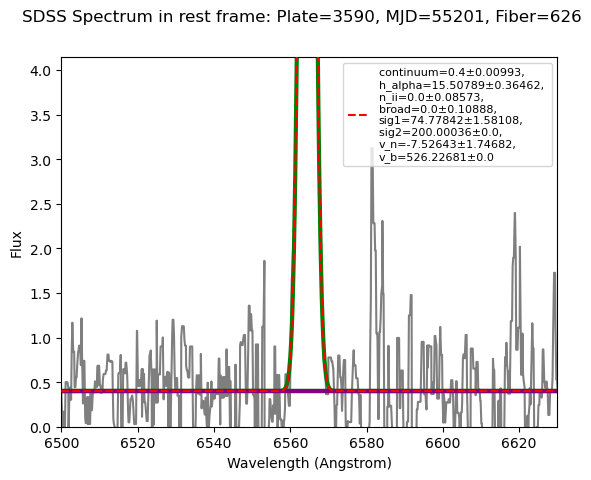

1
3658-55205-474


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.359   13.330    0.078    0.088   67.771  200.027  -13.390  191.185
   0.009    0.430    0.054    0.179    2.350  425.808    1.877  704.963


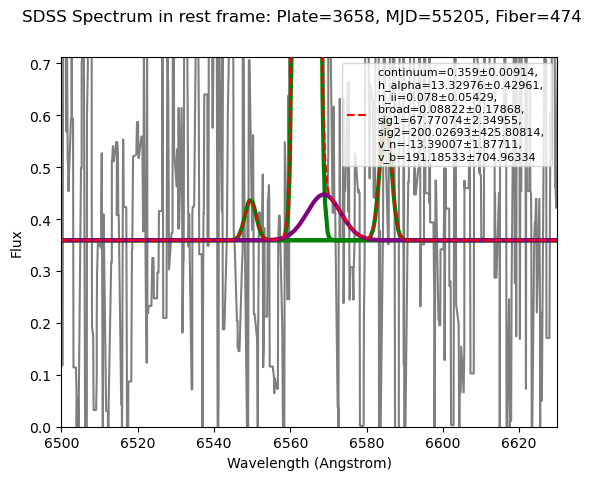

2
3670-55480-196
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.619  108.985    0.234    0.185   69.479  361.173  -19.364 -156.165
   0.010    1.273    0.054    0.172    0.523  252.817    0.601  248.966


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


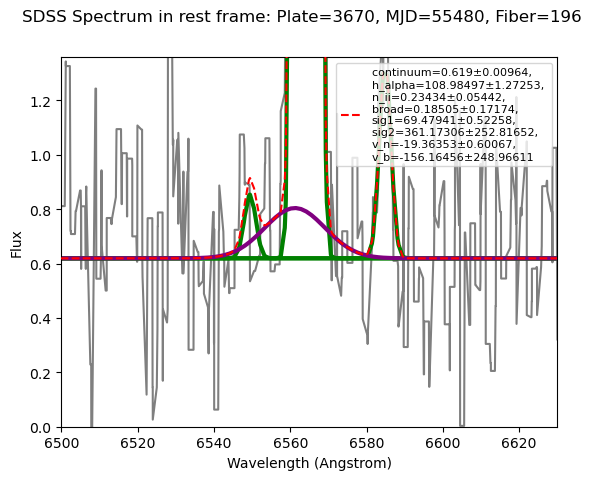

3
3736-55214-352


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   1.476  107.683    0.824    0.148   71.105  200.001  -10.482  358.736
   0.013    1.217    0.078    0.171    0.585  444.560    0.658  429.840


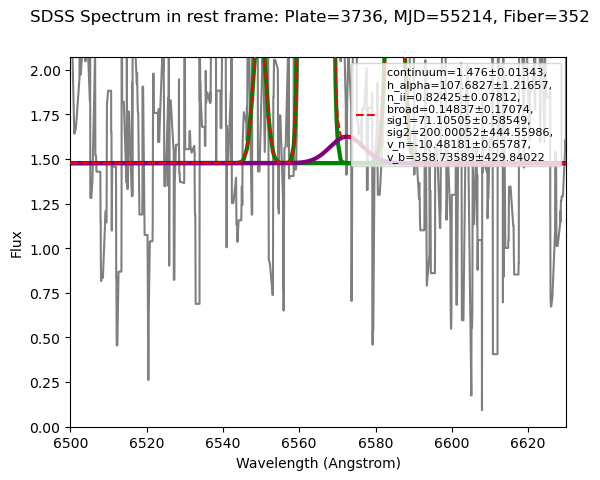

4
3756-55505-496
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.325   50.954    0.266    0.860   72.182  240.250   -1.874  -51.173
   0.014    1.009    0.074    0.560    1.380   86.341    1.216   75.111


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


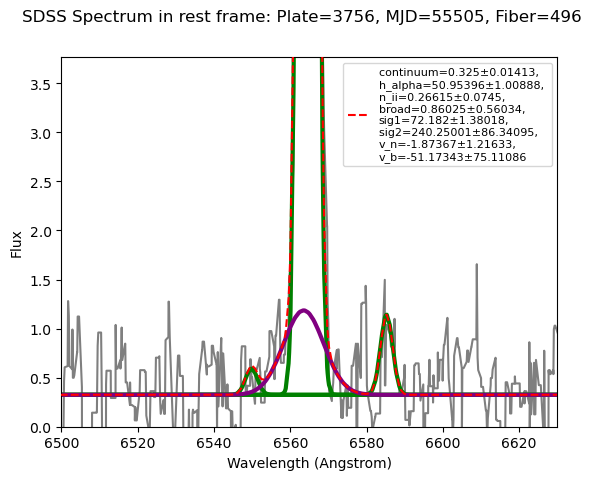

5
3771-55544-724
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.589   58.425    0.524    0.149   71.861  522.255  -15.189 -306.985
   0.013    1.006    0.093    0.128    0.925  512.976    1.023  604.443


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


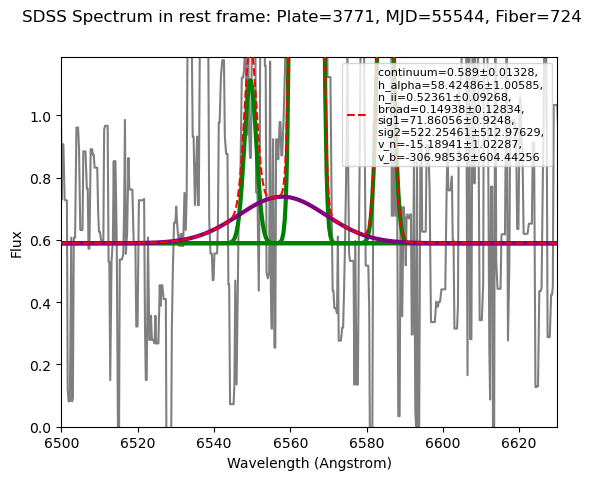

6
3772-55277-770
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.212   32.030    0.043    0.196   77.920  200.000   -8.212  -74.702
   0.011    0.706    0.051    0.609    1.702  278.064    1.365  283.893


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


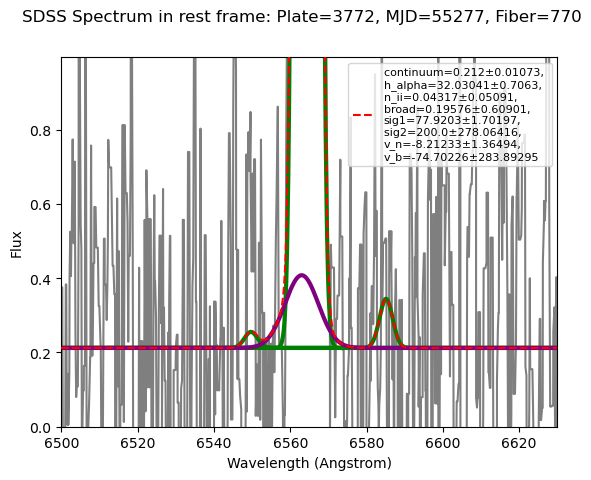

7
3772-55277-848
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   1.066   47.687    0.383    0.055   75.186  200.029   -2.907  670.654
   0.010    0.637    0.126    0.143    0.774  821.233    0.899  913.100


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


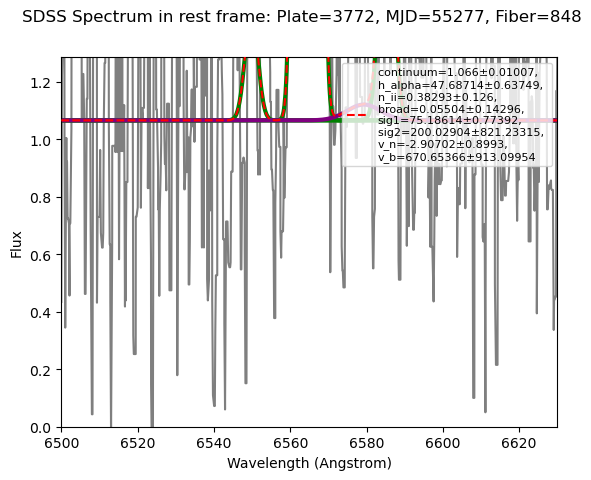

8
3781-55243-697


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.325   23.877    0.027    0.143   71.936  736.822  -10.212 -136.958
   0.006    0.340    0.036    0.051    0.816  268.981    0.890  237.449


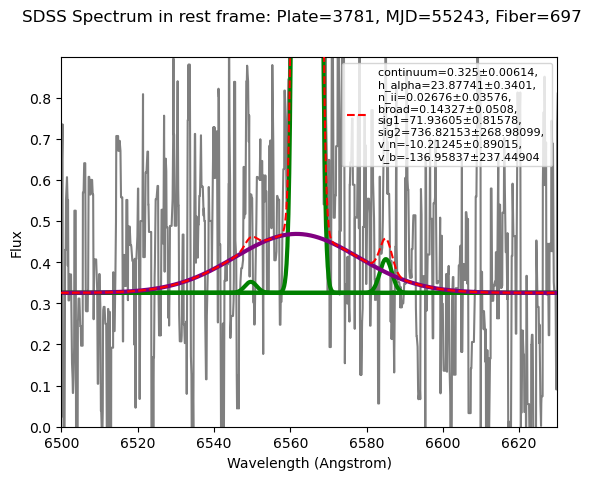

9
3785-55273-942


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.333   11.044    0.103    0.197   78.908  200.000   -5.086  -37.415
   0.012    0.758    0.065    0.771    4.707  362.840    3.080  239.518


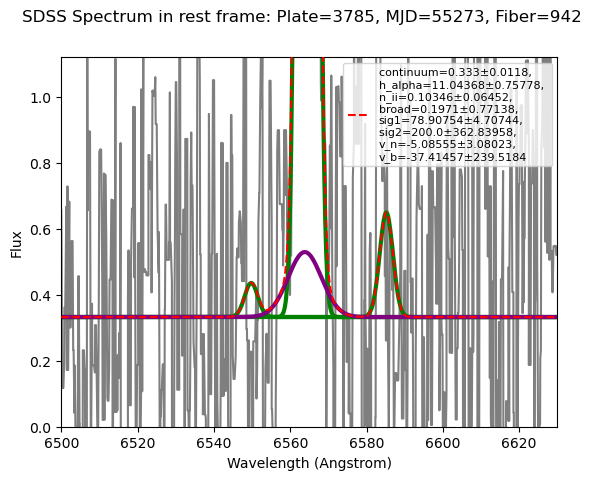

10
3854-55247-608
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.518   19.206    0.073    0.148   71.324  200.000   -2.757 1220.726
   0.009    0.491    0.104    0.164    1.495  296.671    1.686  306.704


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


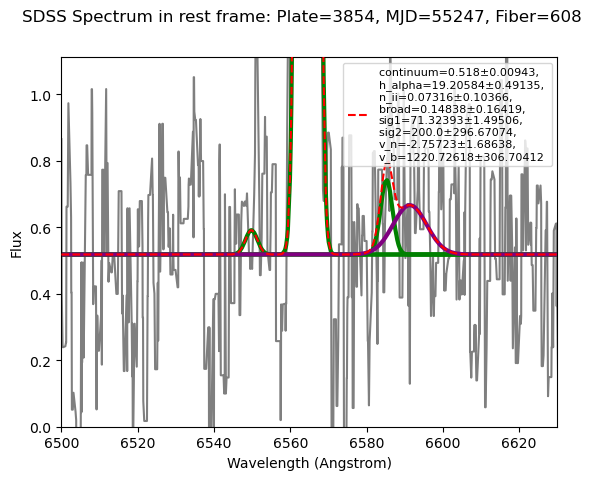

11
3857-55272-492
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.292   10.184    0.071    0.075   73.994  200.000   -1.479 -1034.562
   0.009    0.336    0.050    0.125    2.115  380.530    2.330  382.093


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


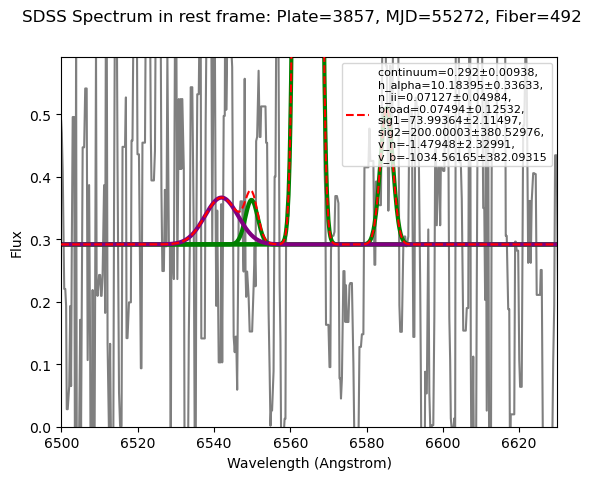

12
3949-55650-124
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.386   39.650    0.250    0.216   68.067  476.327  -16.476 -250.836
   0.010    0.673    0.059    0.110    0.889  233.891    0.976  253.891


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


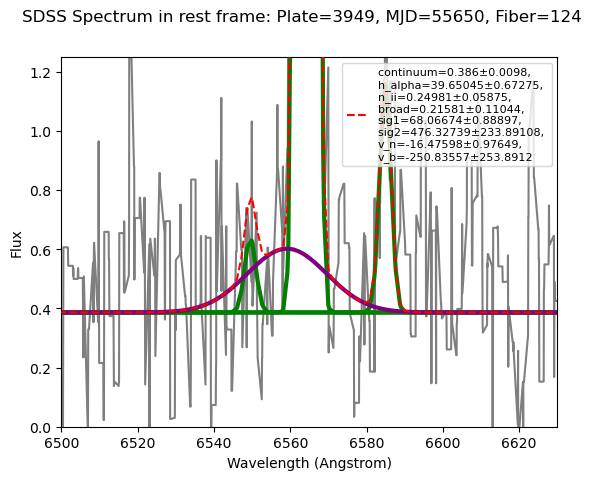

13
3967-55704-768
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.547   45.712    0.222    0.184   70.615  200.000   -5.047 -156.091
   0.010    0.879    0.053    0.345    1.248  213.479    1.243  379.707


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


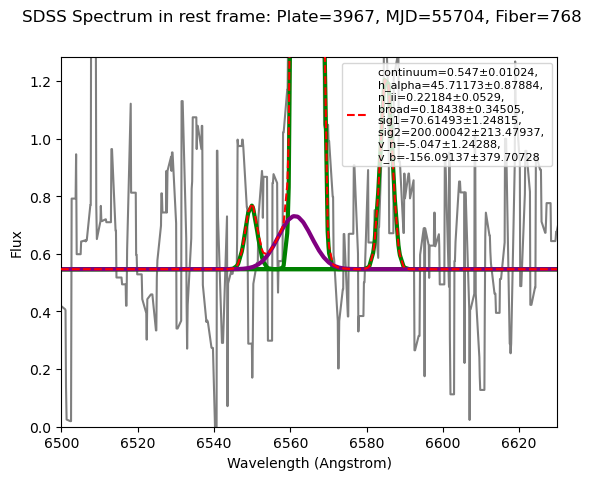

14
4224-55481-614
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.191    9.421    0.088    0.017   65.887  200.033   -3.022  236.261
   0.008    0.455    0.039    0.115    3.400 2298.297    2.773 3325.732


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


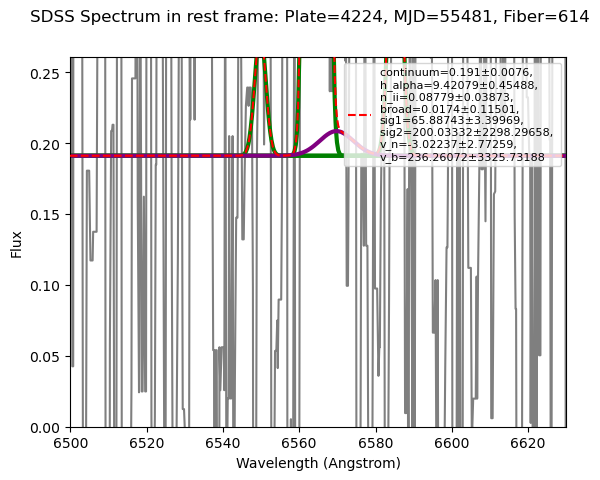

15
4305-55509-964
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.419   31.815    0.206    0.052   79.637  200.047  -12.502  109.033
   0.011    0.764    0.059    0.481    1.948  878.522    1.709 1675.537


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


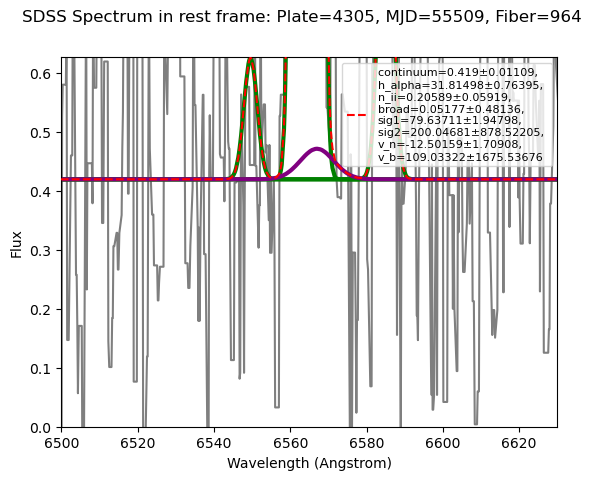

16
4397-55921-976
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.830   42.398    0.180    0.278   71.421  294.727    0.151  965.078
   0.013    0.760    0.107    0.195    0.905  180.679    1.070  154.362


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


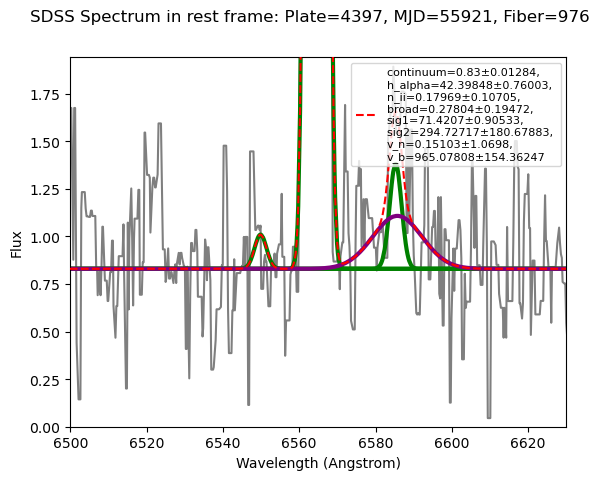

17
4423-55889-170
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.476   50.829    0.147    0.191   69.405  408.822    4.267 1373.580
   0.015    0.843    0.102    0.146    0.862  342.201    1.008  376.393


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


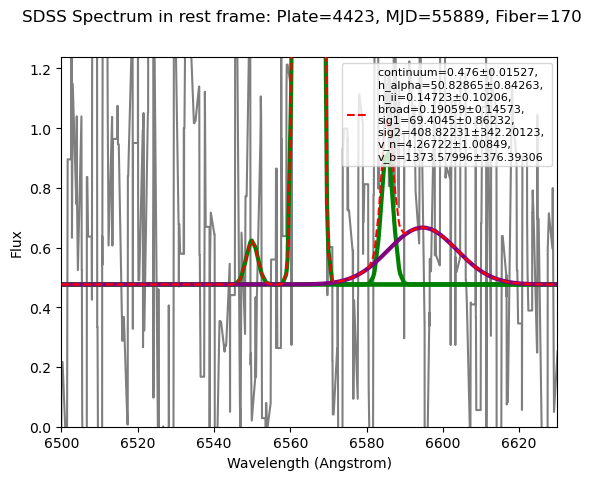

18
4567-55589-44
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.389   52.367    0.000    0.500   74.557  200.000  -20.127  124.298
   0.009    0.907    0.067    0.446    1.318  107.153    1.132  218.680


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


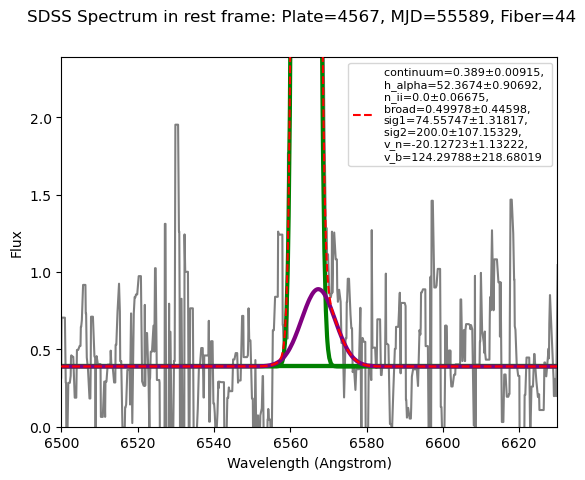

19
4605-55971-444
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   3.108   25.528    0.243    0.207   74.240  200.000   -9.293 1704.849
   0.015    0.656    0.080    0.179    1.553  199.182    1.755  197.051


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


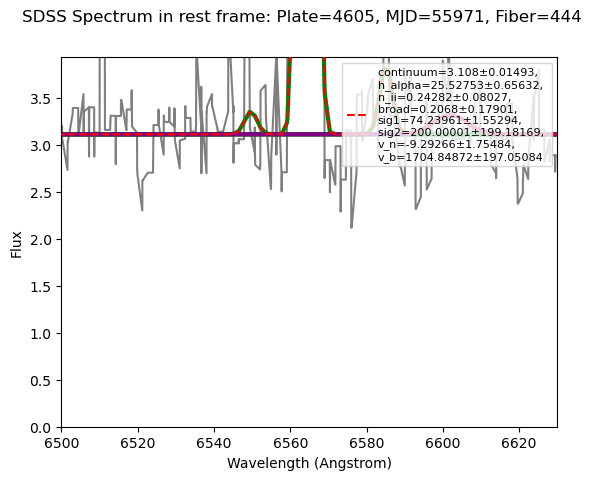

20
4622-55629-262
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.372    9.470    0.000    0.088   67.832  200.000   -7.692  500.896
   0.011    0.370    0.068    0.140    2.649  469.477    2.762  387.435


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


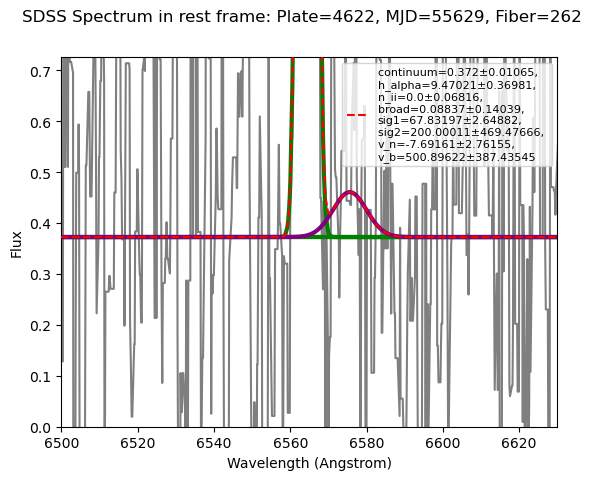

21
4661-55614-29
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   1.817  127.970    0.865    0.359   84.008  200.000   -2.477 -382.244
   0.018    1.550    0.101    0.235    0.752  272.494    0.860  276.864


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


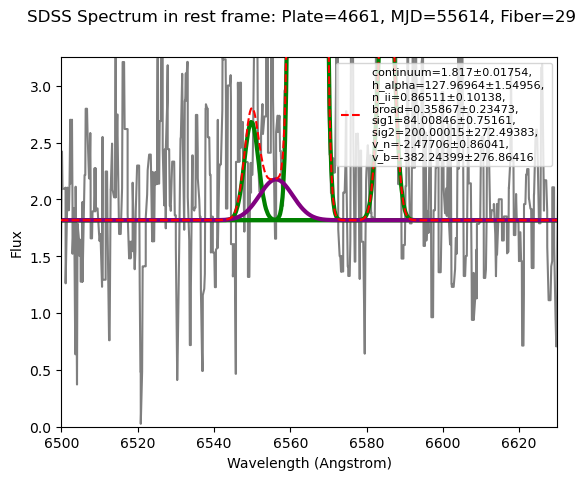

22
4703-55617-398
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.067   39.259    0.108    0.084   68.475  200.014  -13.127  272.622
   0.008    0.645    0.045    0.113    1.034  592.957    0.935  727.404


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


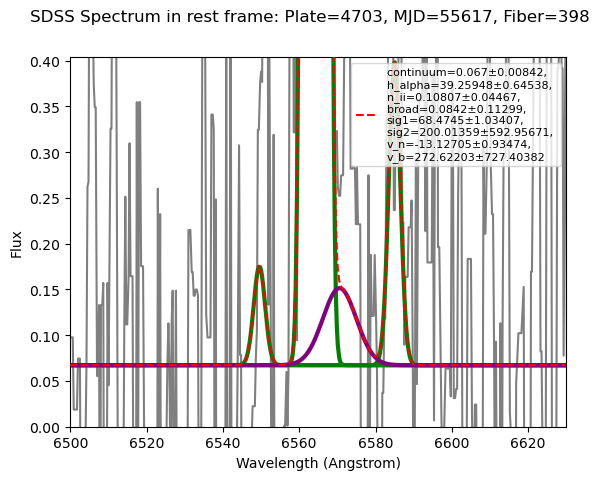

23
4764-55646-337
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   1.359  285.028    1.050    1.741   71.529  237.408   -4.231   15.331
   0.016    4.511    0.101    0.904    0.659   59.970    0.726   41.929


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


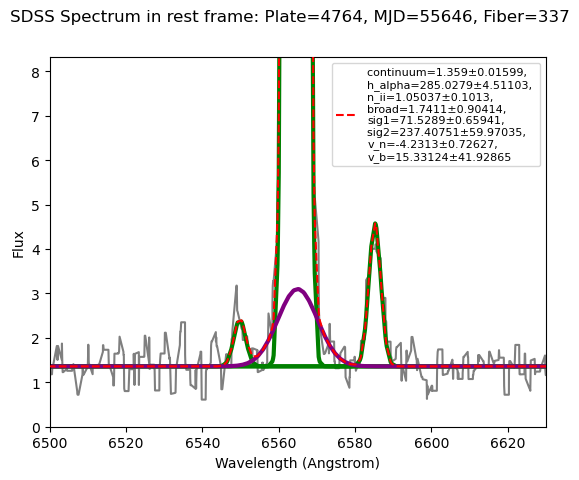

24
4798-55672-66
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.788   33.583    0.074    0.365   70.546  200.000   -9.403    5.558
   0.012    0.849    0.059    0.689    1.785  183.272    1.357  114.357


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


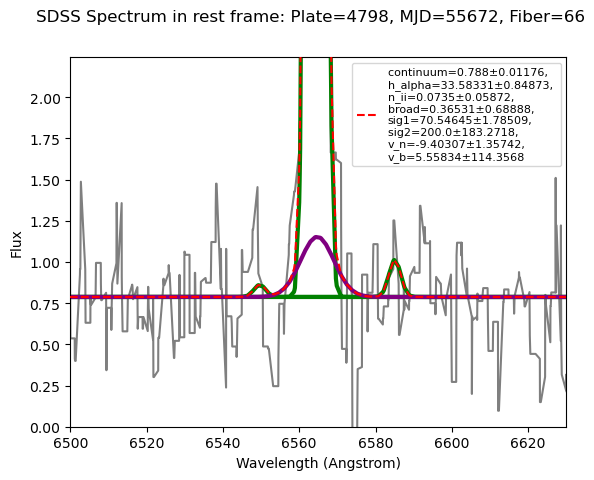

25
4970-56039-771
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.853   48.097    0.244    0.137   73.069  200.000   -1.074 -294.487
   0.012    1.128    0.069    0.222    1.581  653.802    1.435  875.631


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


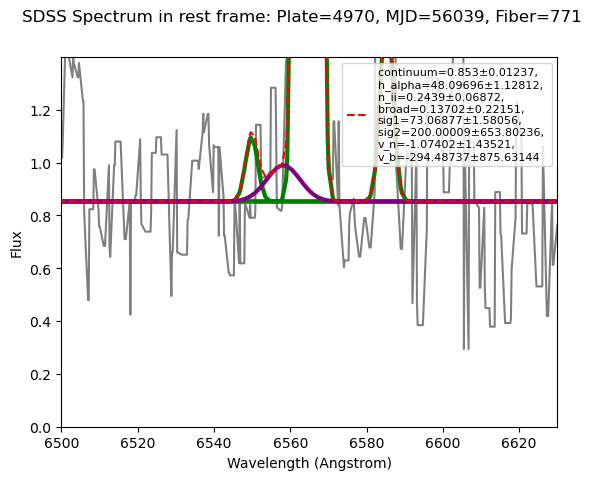

26
5055-55889-818
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.587   42.707    0.143    0.000   69.408  203.698   -2.627 -1299.883
   0.008    0.631    0.045    0.090    0.676 1637665643.377    0.824 2214113143.372


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


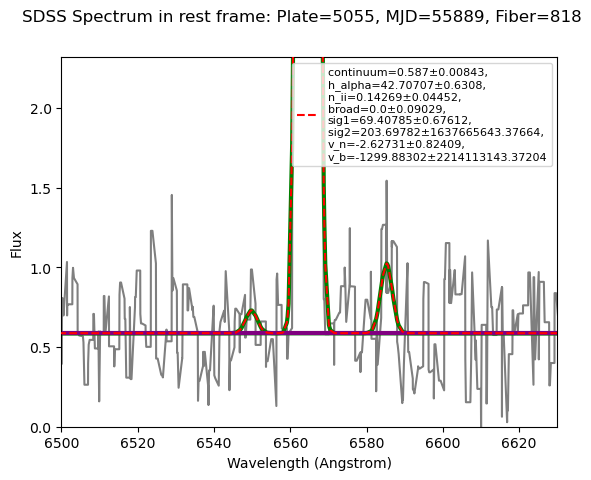

27
5115-55885-87
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   1.660  340.280    0.755    0.331   72.571  429.039  -18.920 -162.155
   0.012    3.522    0.074    0.204    0.357  215.623    0.449  193.122


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


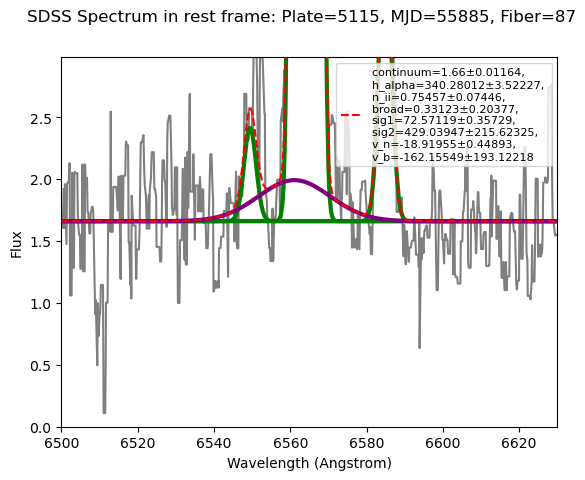

28
5156-55925-290
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.397  138.323    0.366    0.209   71.227  200.000    7.998 -746.829
   0.013    1.550    0.076    0.164    0.451  181.489    0.580  179.953


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


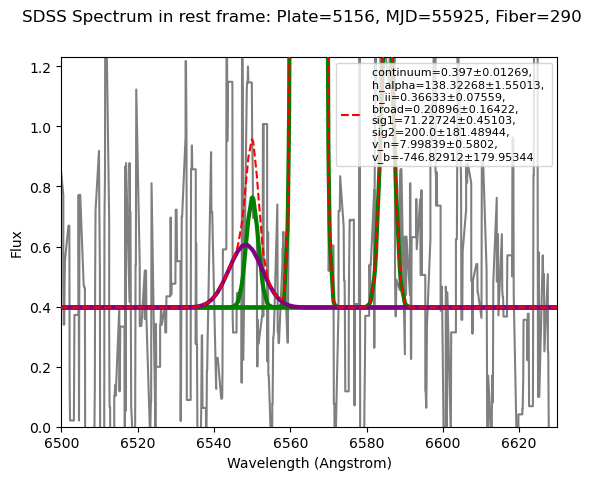

29
5181-56298-848
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.383   37.896    0.134    0.215   69.695  407.872   -2.298 -237.593
   0.015    0.807    0.079    0.173    1.253  304.668    1.323  344.763


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


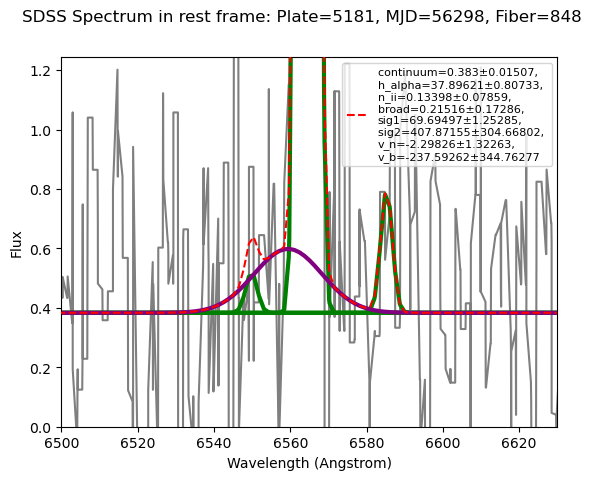

30
5181-56298-962
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.569   50.688    0.226    0.166   71.905  200.010  -11.515  545.636
   0.020    1.087    0.140    0.251    1.180  448.691    1.371  366.273


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


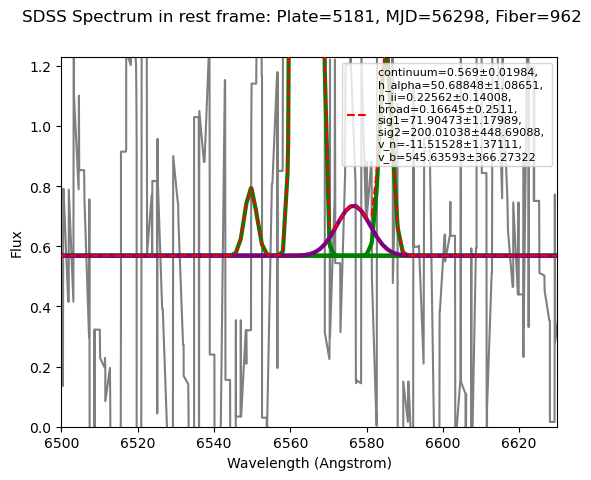

31
5728-56334-938


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.669   61.492    0.327    0.767   71.282  200.000    1.013 -972.743
   0.021    1.320    0.131    0.270    1.198   85.903    1.407   81.026


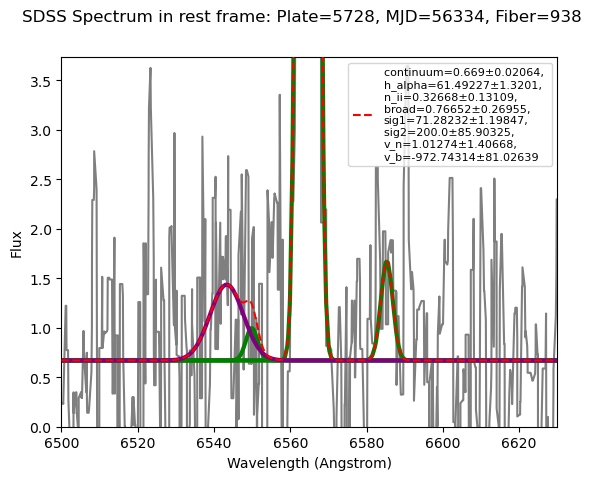

32
5735-55980-704
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.359   20.010    0.000    0.406   74.237  200.000   -6.537  -19.269
   0.017    1.300    0.119    1.336    4.255  324.499    2.614  194.633


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


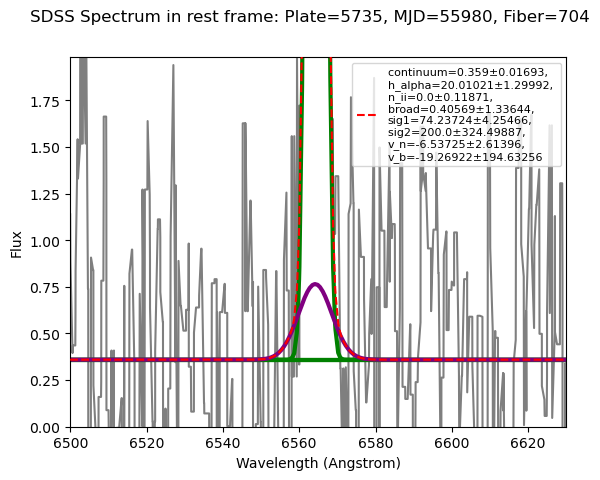

33
5740-55998-343
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.354   30.598    0.150    0.152   71.198  200.000   -0.283 1958.692
   0.013    0.694    0.078    0.185    1.325  295.659    1.520  300.137


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


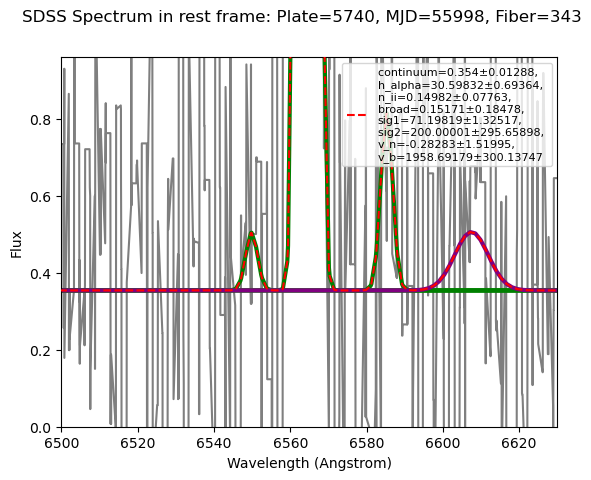

34
5803-56272-472
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.413   32.944    0.150    0.000   75.427  200.438    0.317 -271.033
   0.014    0.640    0.099    0.233    1.467    0.000    1.512    0.000


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


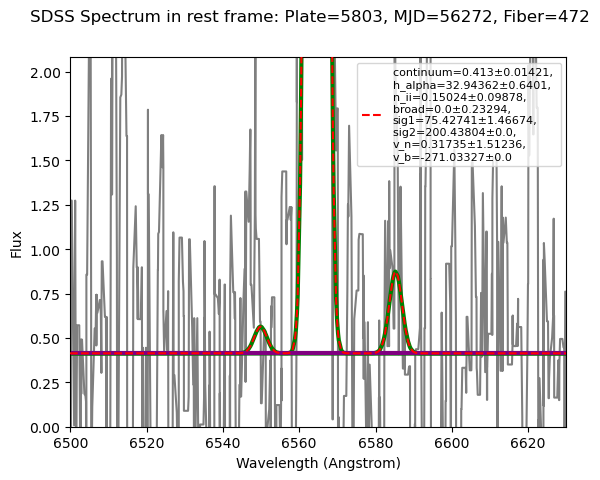

35
5808-56325-383
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   1.446  206.992    1.388    0.190   72.499  454.626   -6.135 -342.621
   0.012    2.475    0.076    0.126    0.425  285.822    0.542  360.197


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


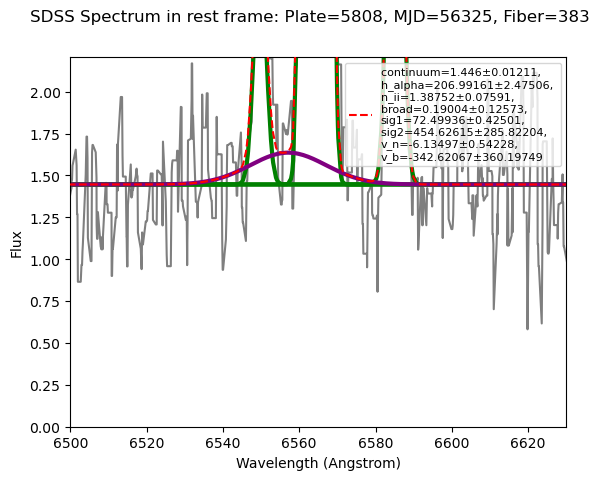

36
5883-56033-202
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.342   23.766    0.038    0.285   74.408  200.000   -6.310 -1373.382
   0.013    0.634    0.072    0.190    1.535  161.525    1.780  149.727


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


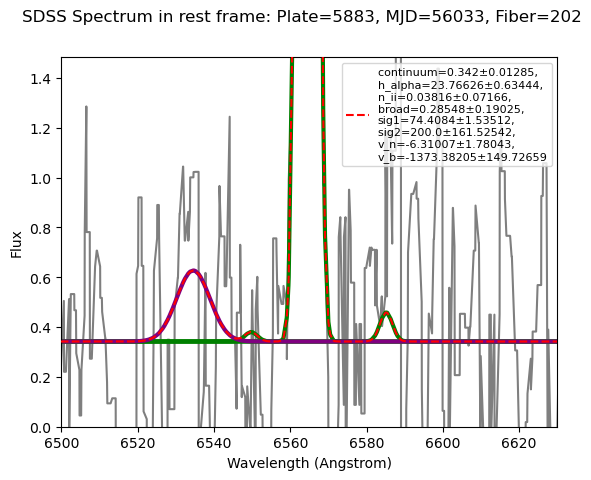

37
5965-56190-682
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.602   36.395    0.244    0.095   69.372  884.010   -6.092 -1775.740
   0.009    0.715    0.049    0.057    0.914  638.883    1.091  604.221


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


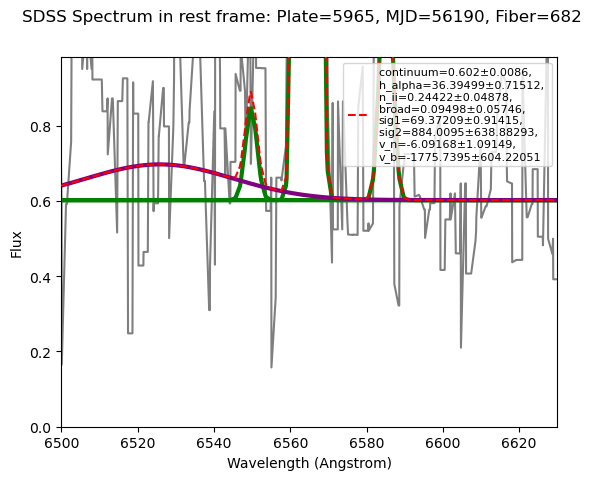

38
6012-56101-730


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.295   25.248    0.154    0.290   74.699  230.551   -8.771   82.429
   0.008    0.526    0.041    0.297    1.499  135.831    1.364  153.786


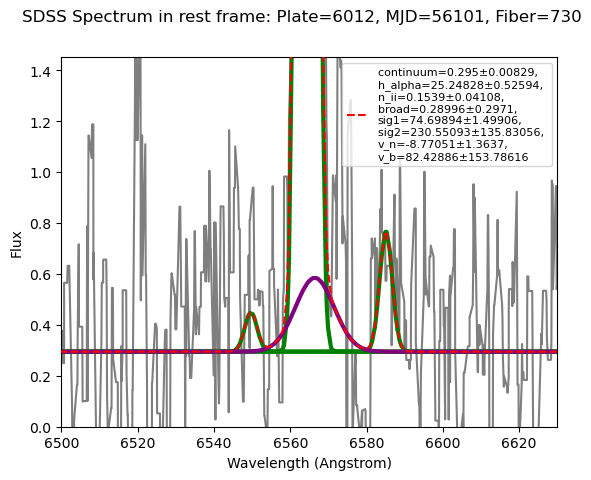

39
6017-56075-246
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.630   27.038    0.264    0.085   75.084  200.000   -1.987  -93.949
   0.009    0.630    0.054    0.484    1.753  525.091    1.515  668.331


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


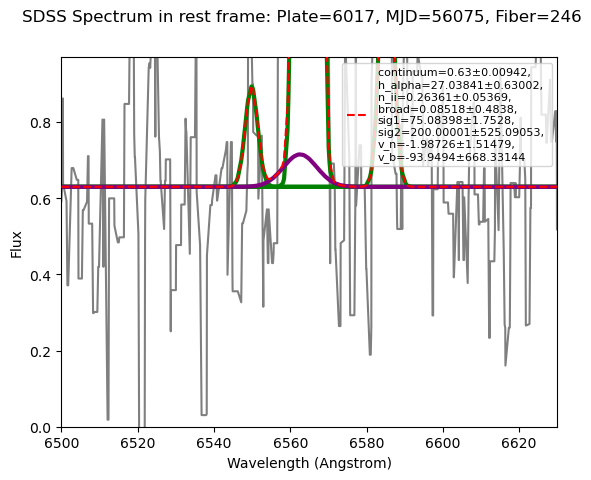

40
6059-56093-88
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.456   16.721    0.157    0.087   67.025  252.669   -8.273 -1574.871
   0.009    0.485    0.053    0.108    1.473  351.382    1.699  352.285


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


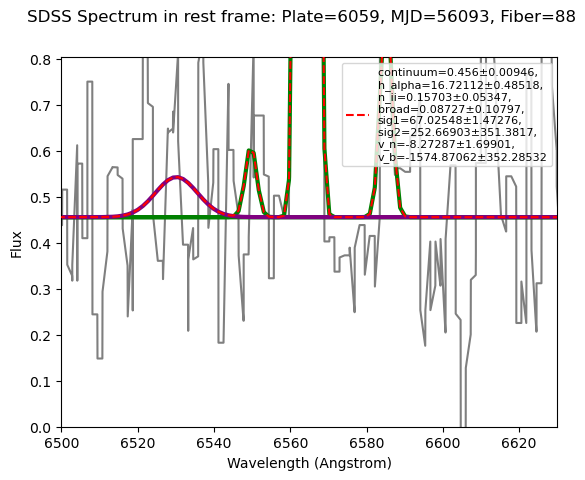

41
6307-56205-674
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.722   43.514    0.392    0.218   75.377  200.000    2.616 -349.353
   0.012    0.778    0.108    0.228    1.275  430.252    1.283  450.806


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


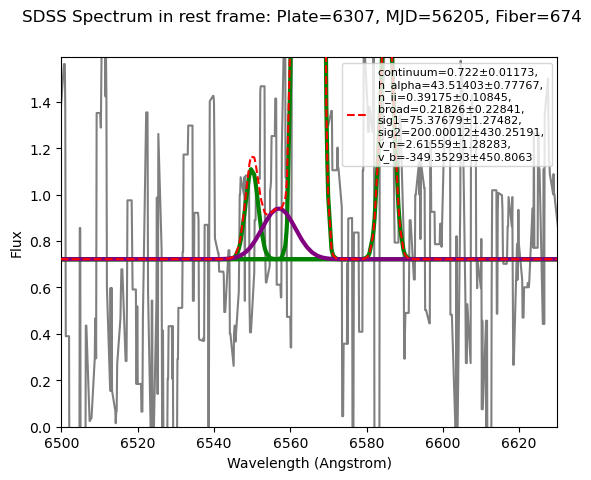

42
6369-56217-105
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.344   23.873    0.056    0.600   70.555  200.000   -5.673 -1064.188
   0.019    0.672    0.117    0.401    1.756  115.132    1.901  121.056


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


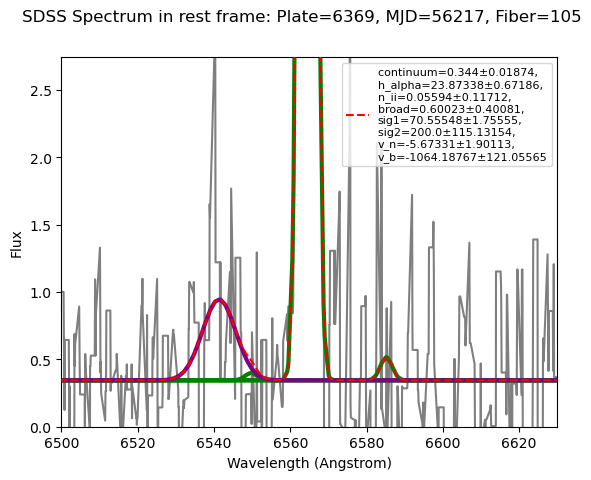

43
6402-56334-33
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   4.289  655.759    4.441    6.518   87.397  200.000  -34.867   36.129
   0.023   14.727    0.205    3.319    1.015   31.546    1.155   38.244


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


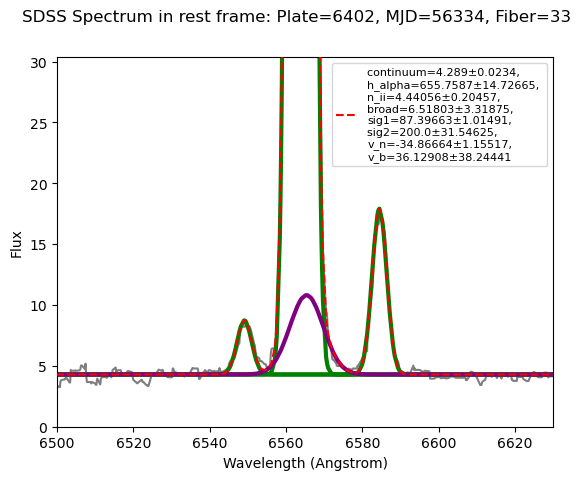

44
6406-56330-968
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.317   12.187    0.007    0.144   69.245  200.000   -4.330 -1621.182
   0.011    0.471    0.082    0.166    2.370  257.022    2.611  244.977


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


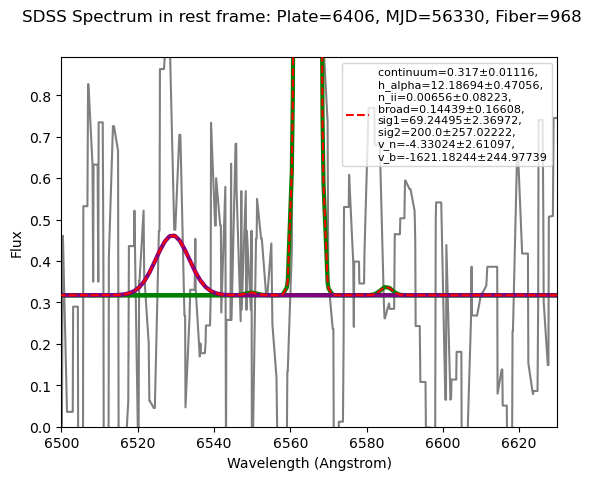

45
6415-56310-610
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   1.082  107.357    0.993    0.119   69.123  200.000   -7.272  939.222
   0.014    2.018    0.150    0.320    0.654  404.899    0.886  314.439


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


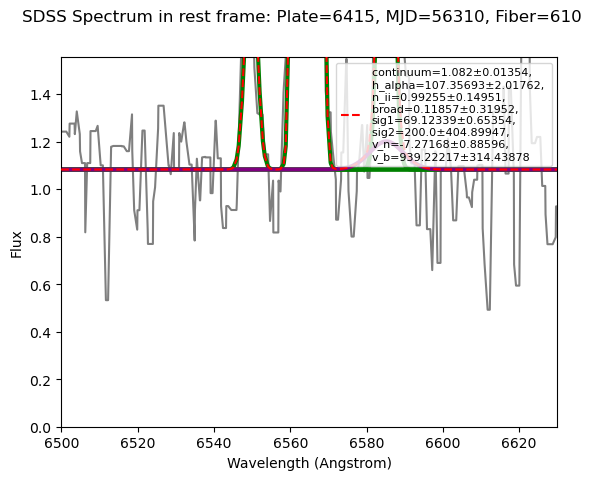

46
6430-56299-960
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.417   29.707    0.315    0.066   73.295  200.000   -2.246 -398.262
   0.011    0.565    0.063    0.159    1.211  785.313    1.304  688.554


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


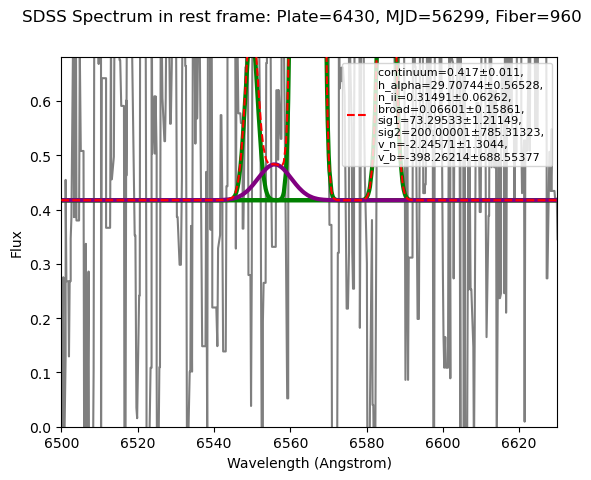

47
6442-56369-233
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.305   23.291    0.048    0.118   72.794  200.000  -10.464  -87.161
   0.008    0.510    0.043    0.377    1.616  311.163    1.377  350.228


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


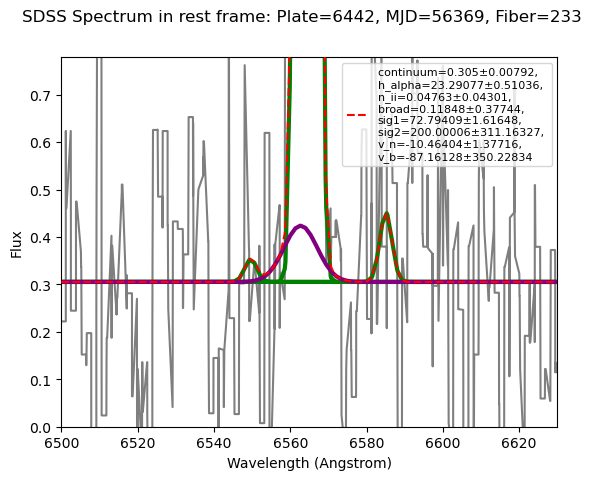

48
6473-56363-410
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.545   88.117    0.638    0.056   73.589  200.053   -8.741  213.969
   0.012    1.471    0.078    0.311    1.088 1522.218    0.948 2482.517


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


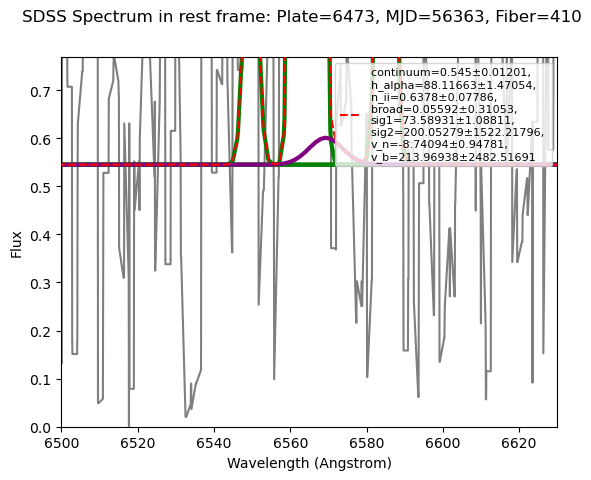

49
6582-56274-654


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.421   23.179    0.085    0.084   69.977  200.021  -11.338  144.631
   0.008    0.528    0.050    0.323    1.658  455.537    1.473  777.790


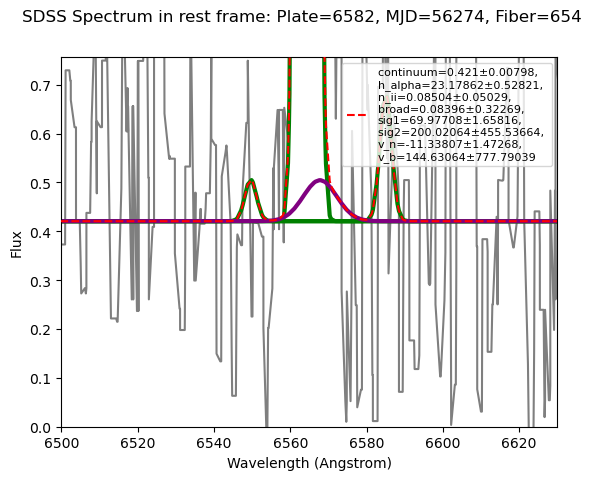

50
6619-56371-446


       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.606   68.196    0.075    0.070   71.099  200.000   -3.019 1115.017
   0.011    1.062    0.121    0.170    0.681  600.188    0.842  810.565


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


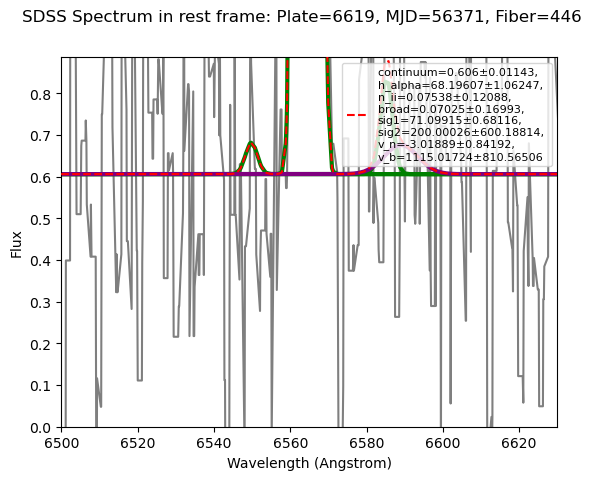

51
6880-56543-772
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.588   25.813    0.239    0.215   71.242  200.000  -11.308  189.301
   0.009    0.637    0.050    0.259    1.815  206.414    1.493  371.981


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


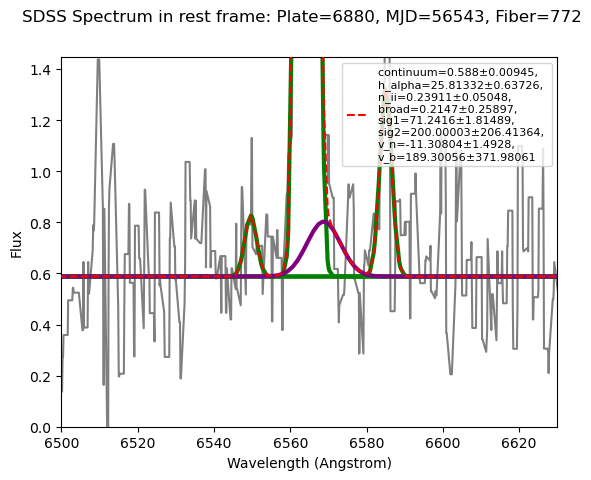

52
6982-56444-62
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.734   21.136    0.052    0.136   77.472  748.702   -6.057 -459.258
   0.012    0.557    0.072    0.097    1.755  577.813    1.815  722.718


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


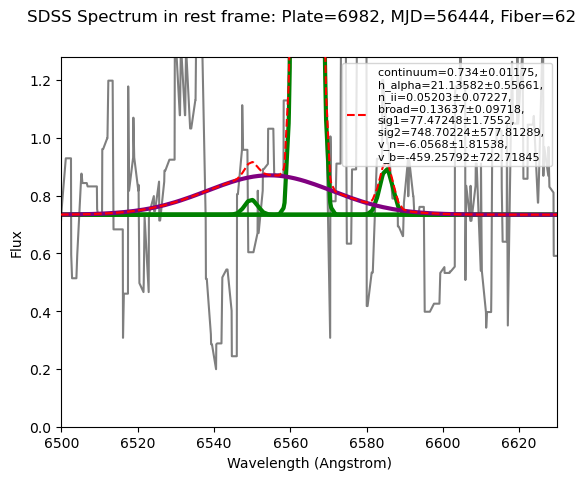

53
7110-56746-282
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.407   17.454    0.053    0.102   72.371  200.019   -7.795  431.724
   0.010    0.446    0.082    0.151    1.675  486.779    1.798  420.939


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


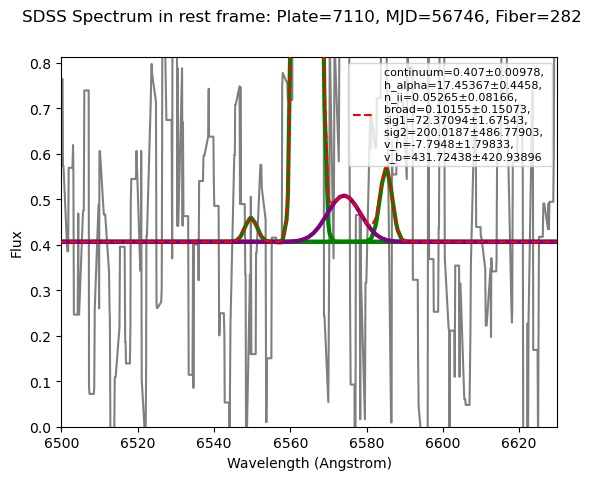

54
7146-56573-938
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.472   26.829    0.157    0.087   67.757  200.000  -14.780  615.947
   0.012    0.695    0.103    0.153    1.385  539.471    1.588  492.541


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


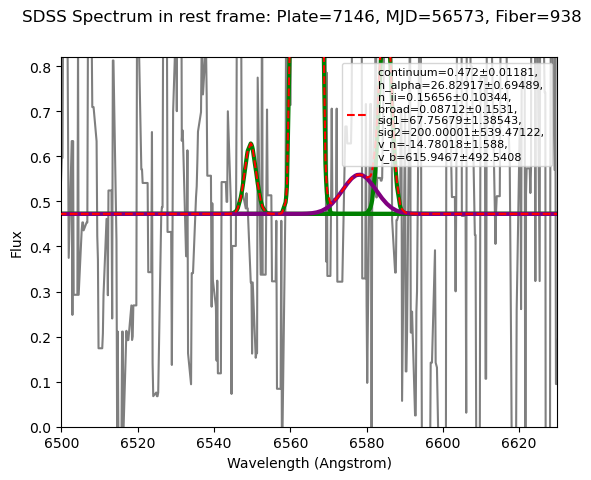

55
7240-56665-473
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.816   91.455    0.628    0.130   70.895  426.080    5.348  -57.682
   0.014    1.156    0.104    0.241    0.685  709.384    0.727  537.867


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


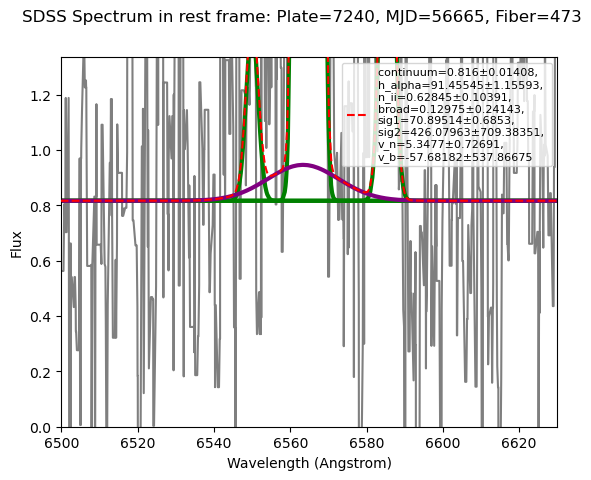

56
7241-56606-262
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   1.118   32.846    0.221    0.018   72.549  200.040   -7.387 -263.489
   0.009    0.716    0.054    0.188    1.591 3755.720    1.246 5633.988


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


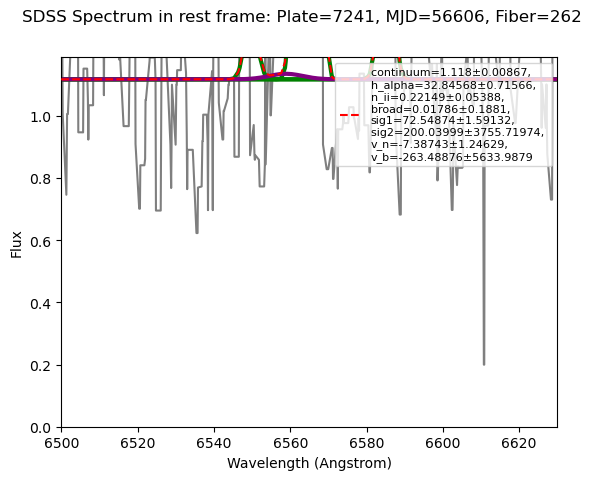

57
7248-56630-816
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.141   25.580    0.100    0.146   68.687  346.991   -6.274 -646.460
   0.007    0.373    0.037    0.090    0.901  268.008    0.960  217.022


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


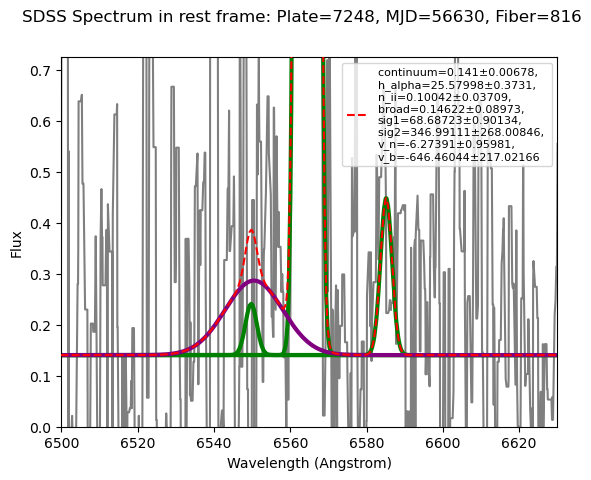

58
7303-57013-305
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.663  175.337    0.275    0.459   74.768  217.305    0.860  448.748
   0.016    2.013    0.166    0.269    0.544  229.669    0.654  168.226


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


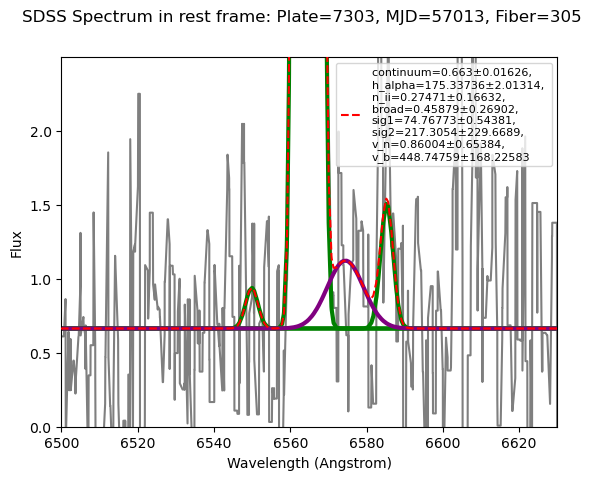

59
7384-56715-556
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.782   91.069    0.593    0.243   70.390  200.000  -17.147  248.404
   0.010    1.265    0.060    0.167    0.775  283.549    0.719  389.986


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


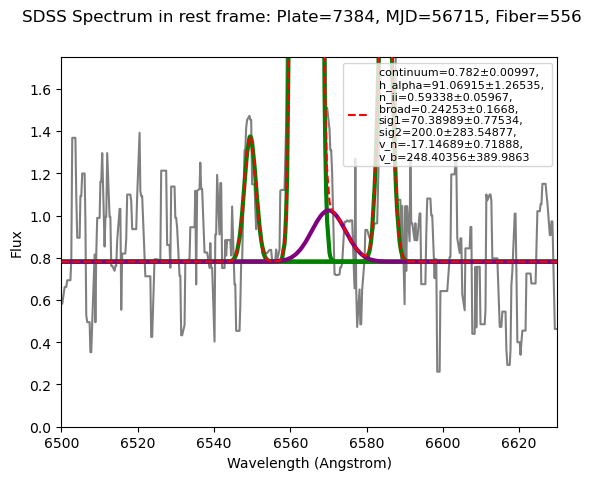

60
7420-56753-918
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.194   72.790    0.215    0.190   71.687  379.911  -19.938  772.497
   0.010    1.134    0.067    0.110    0.654  253.627    0.810  233.710


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


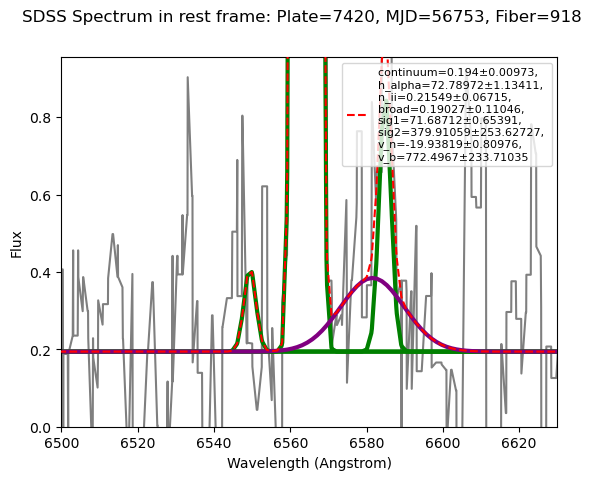

61
7625-57011-754


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.586   19.704    0.151    0.210   75.214  200.000  -12.114 -315.504
   0.010    0.545    0.052    0.129    2.088  372.579    1.695  356.763


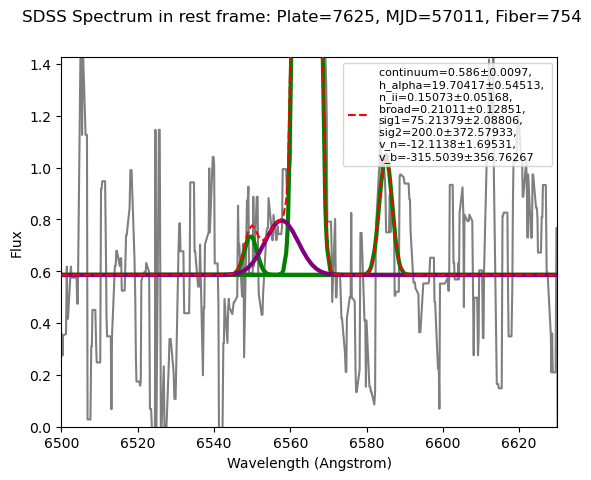

62
7647-57655-401
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.521   62.619    0.336    0.504   71.269  200.001  -39.069  102.084
   0.012    1.089    0.062    0.378    1.064   85.958    1.063  152.800


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


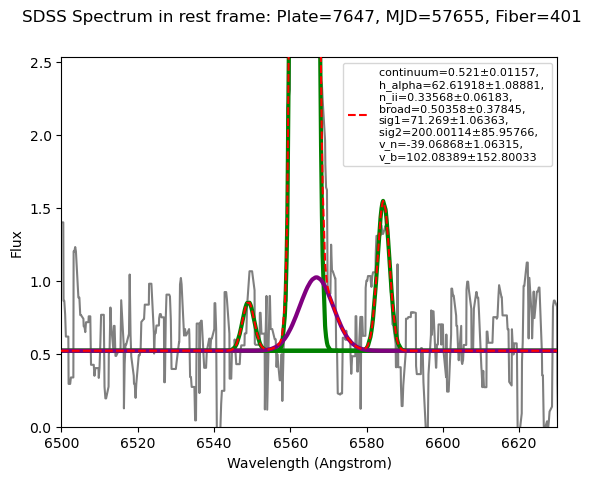

63
7661-57286-304
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.345   22.196    0.194    0.196   71.379  200.000    1.979 -770.860
   0.008    0.456    0.045    0.125    1.228  147.932    1.385  170.844


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


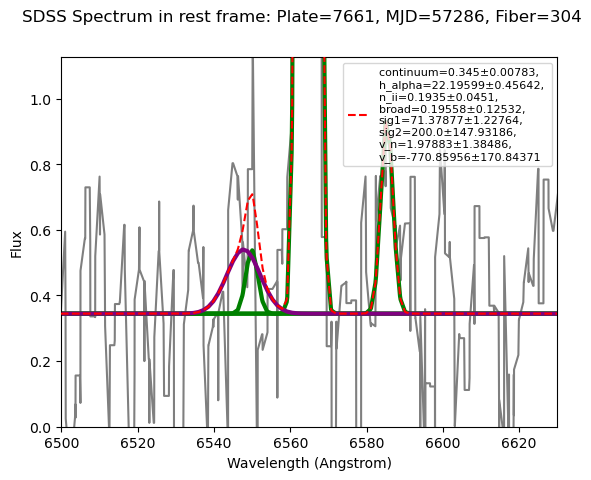

64
7666-57339-993
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.391  178.477    0.219    0.650   71.350  200.001  -19.253  126.102
   0.016    2.451    0.098    0.534    0.691   94.096    0.744  175.886


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


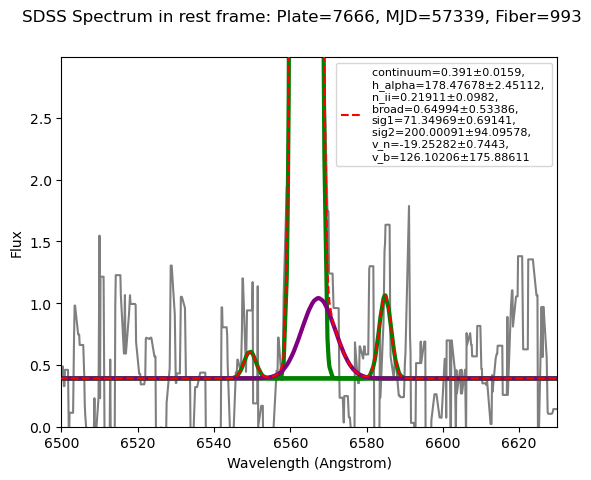

65
7684-57286-76
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.336   58.051    0.148    0.124   73.933  200.021   -0.444 -214.692
   0.010    0.880    0.078    0.296    1.087  460.194    0.931  794.276


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


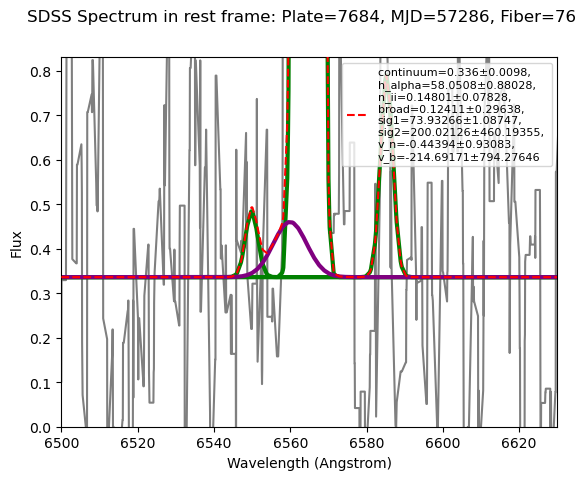

66
7742-58076-795
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.269   12.146    0.074    0.329   70.278  200.002   -1.988 -114.425
   0.011    0.514    0.065    0.389    3.201  133.962    2.705  189.771


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


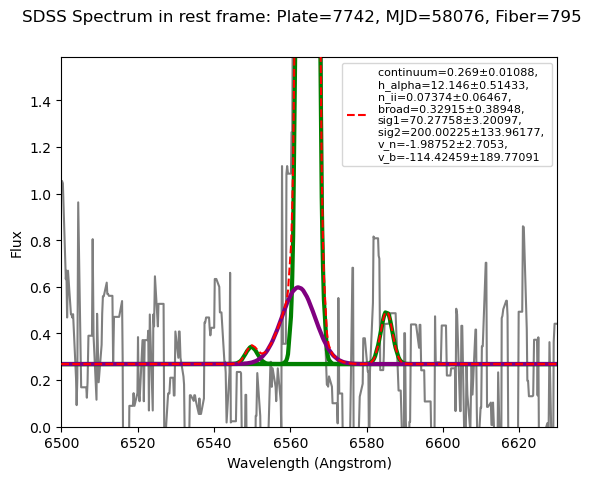

67
7879-57359-682
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.472   25.442    0.071    0.090   75.361  234.459   -2.789 1065.367
   0.010    0.507    0.087    0.170    1.151  412.248    1.343  466.496


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


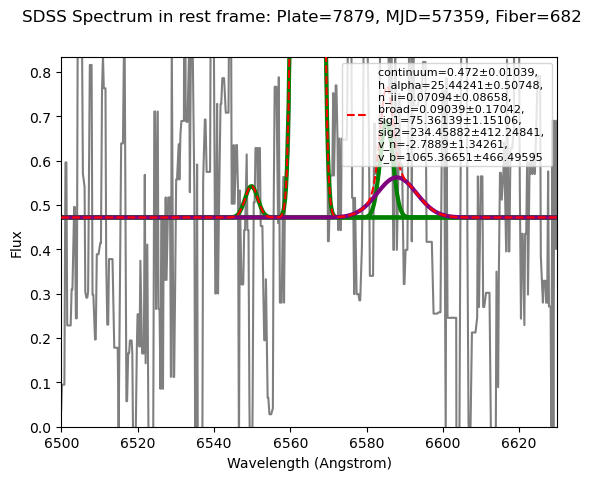

68
8176-57131-786
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.211   35.061    0.071    0.143   69.226  351.274    5.157 -392.793
   0.009    0.781    0.063    0.120    1.249  351.023    1.311  428.177


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


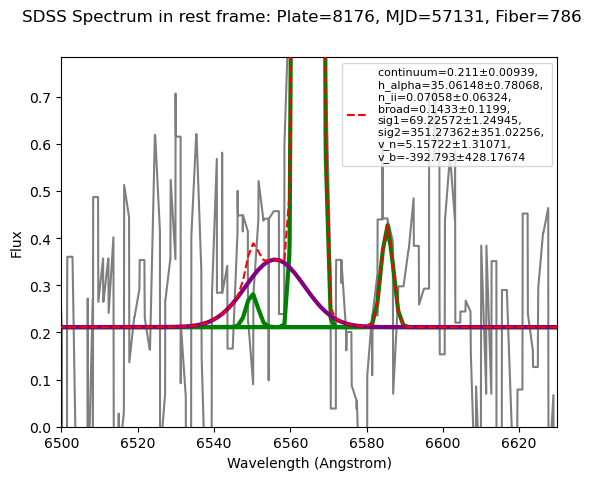

69
8203-57428-777
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   1.092   99.256    0.473    0.240   69.782  200.000  -11.152 -940.449
   0.013    1.654    0.073    0.163    0.632  160.618    0.843  164.785


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


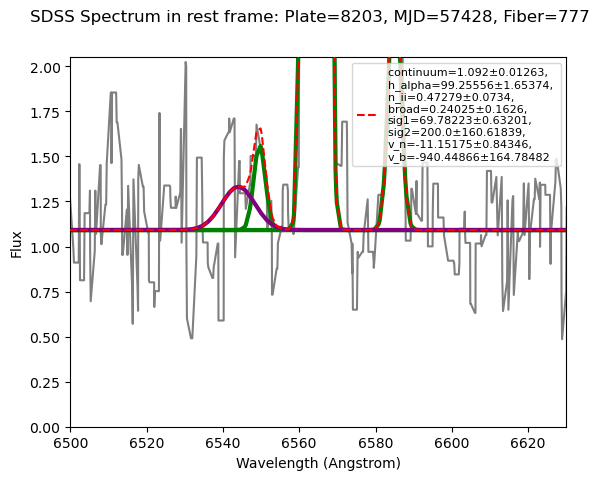

70
8208-57430-774


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.706  112.822    0.772    0.479   75.132  200.003  -11.643  166.211
   0.011    1.573    0.070    0.453    0.838  119.480    0.832  242.132


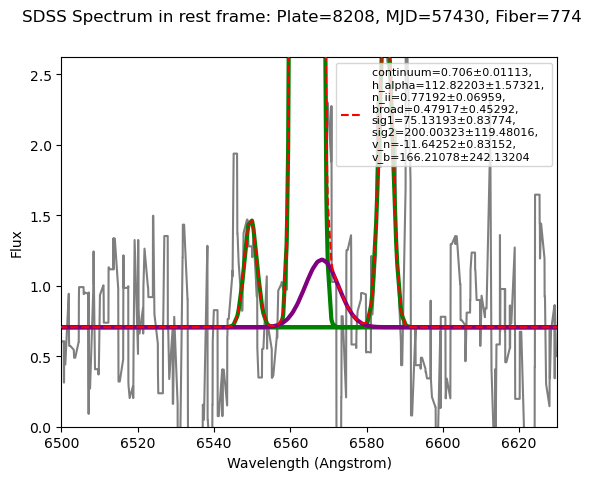

71
8213-58193-918
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.398   37.187    0.374    0.139   70.305  202.247  -10.206 -415.440
   0.013    0.718    0.123    0.165    1.120  451.389    1.221  344.568


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


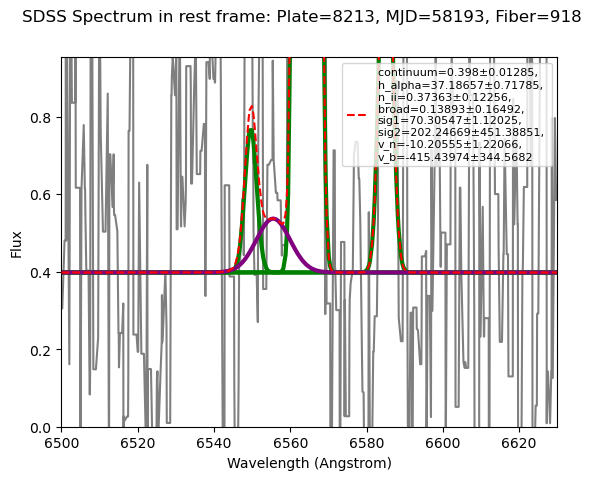

72
8220-57432-826


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.686   92.868    0.252    0.306   76.304  200.007    1.467   99.955
   0.010    1.108    0.067    0.555    0.800  166.916    0.770  237.813


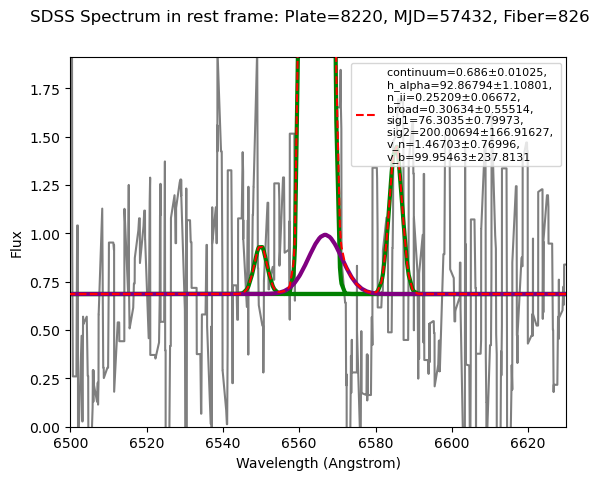

73
8227-57427-885
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   1.240   40.465    0.290    0.136   68.431  227.582   -1.567 -1622.066
   0.011    0.919    0.063    0.134    0.997  252.829    1.237  247.059


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


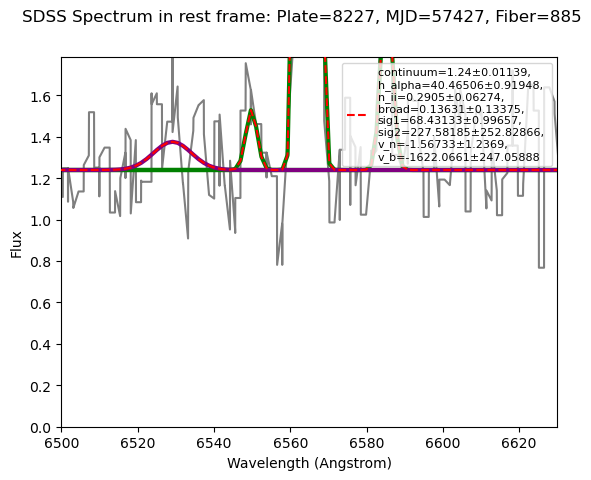

74
8237-58162-364


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.540   51.354    0.353    0.095   71.419  200.018    1.011  437.552
   0.012    0.852    0.067    0.159    0.869  538.565    1.010  479.074


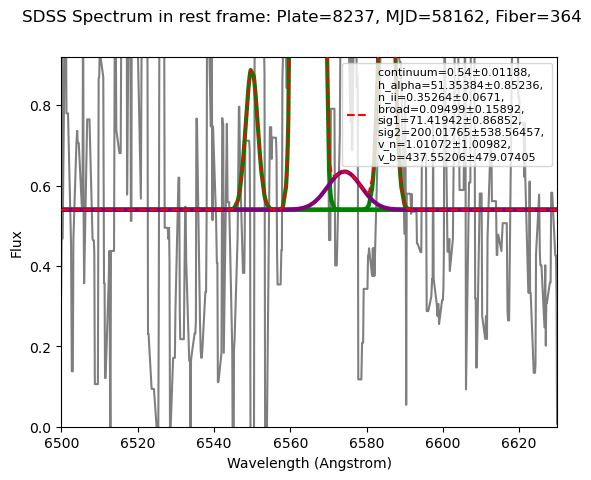

75
8291-57391-701


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.258   93.277    0.175    0.179   69.987  497.845   13.224 1469.194
   0.010    1.076    0.063    0.077    0.477  254.450    0.608  277.126


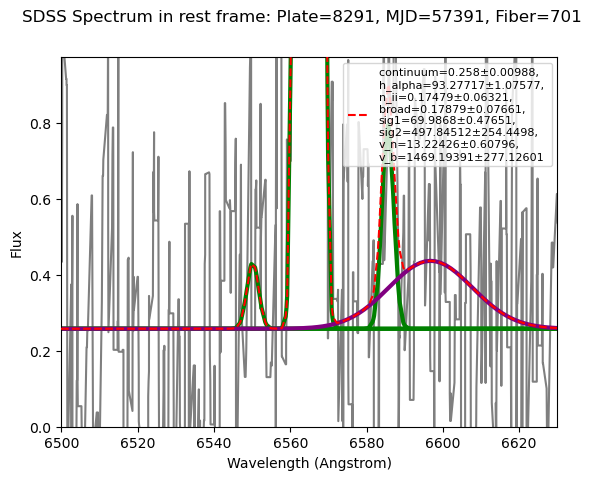

76
8359-57449-804
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.334   44.494    0.259    0.231   73.414  570.511   -8.467  293.259
   0.009    0.709    0.066    0.099    0.877  262.119    0.976  282.023


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


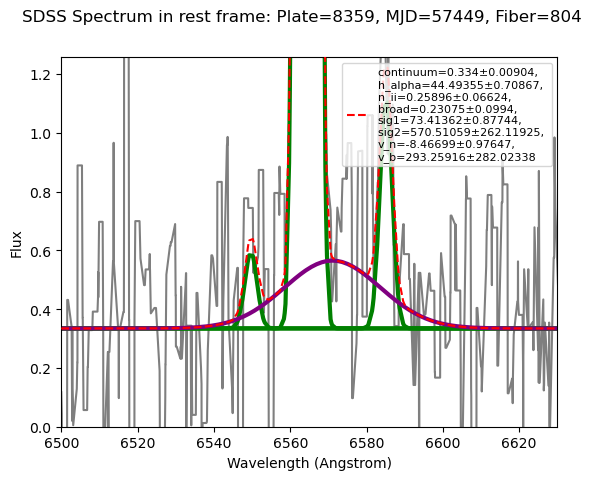

77
8384-57513-409
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.553   48.536    0.249    0.278   67.328  200.000   -8.229 -1041.269
   0.011    0.871    0.060    0.165    0.817  131.453    1.002  133.310


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


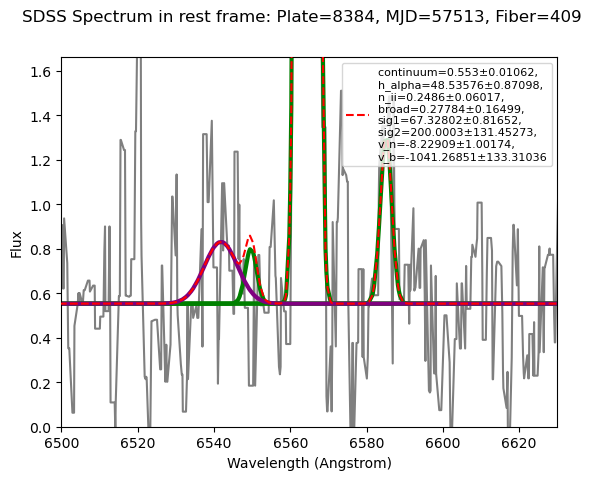

78
8412-58172-138
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.216   52.985    0.152    0.909   73.728  200.000  -24.351  -38.557
   0.008    0.964    0.053    0.775    1.279   79.290    0.968   50.033


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


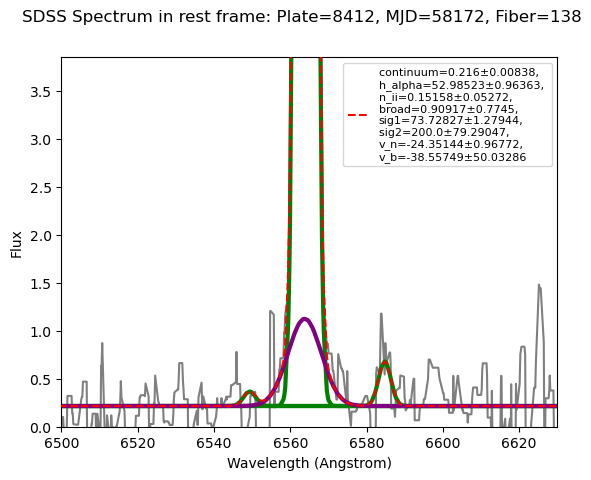

79
8414-57846-806
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.257    7.971    0.053    0.239   69.813  200.000  -12.445  432.873
   0.010    0.360    0.058    0.130    3.131  163.796    3.258  139.742


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


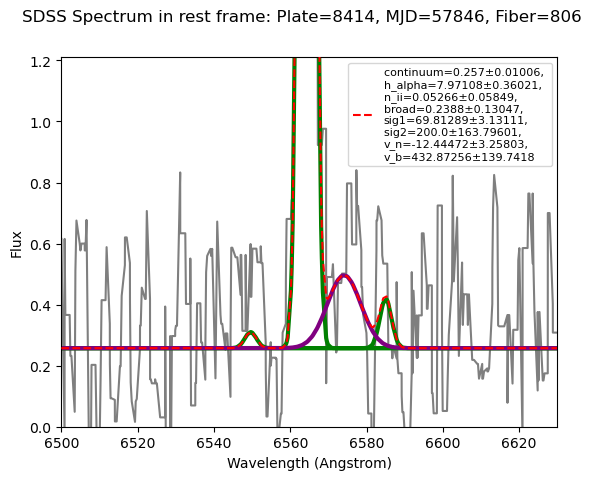

80
8425-58226-608
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.182   56.603    0.229    0.157   66.442  200.006  -11.930  119.817
   0.012    1.016    0.078    0.473    1.117  441.826    1.059  687.711


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


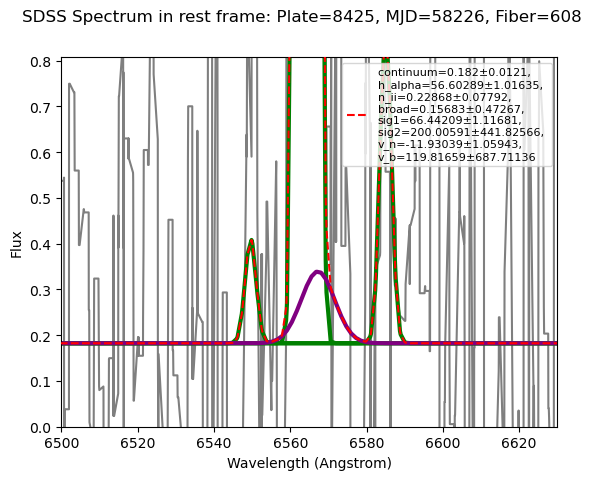

81
8493-58162-318


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.487   52.656    0.468    0.083   74.674  708.414  -10.970  158.883
   0.012    1.016    0.076    0.099    0.957  852.621    1.134  790.741


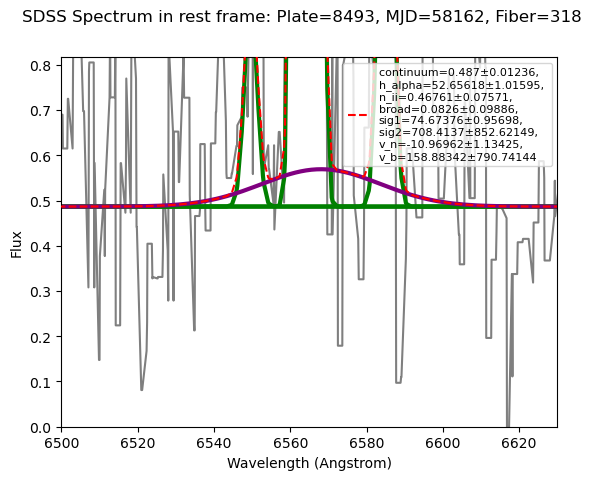

82
8504-57518-333
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.292   28.657    0.007    0.274   67.629  200.000   -3.030  406.199
   0.009    0.626    0.051    0.117    1.123  134.661    1.282  118.397


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


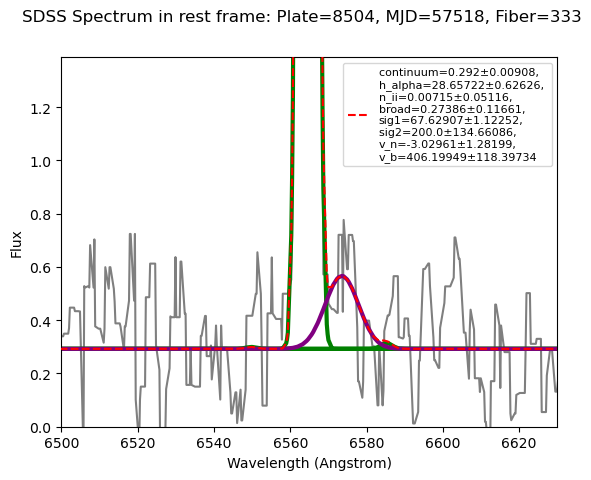

83
8522-58193-515
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   1.132   91.461    0.559    0.214   68.417  658.343   -5.786  283.411
   0.016    1.560    0.098    0.128    0.733  402.971    0.898  415.342


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


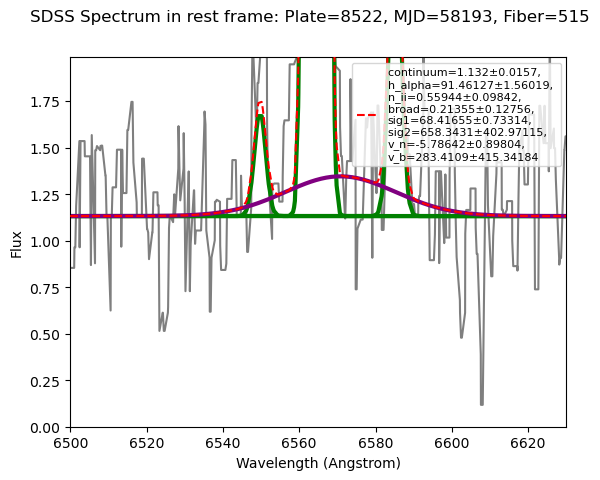

84
8791-57373-585


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.532   98.206    0.325    0.054   67.447  200.056   -7.423  229.807
   0.008    0.794    0.048    0.126    0.475  920.496    0.405 1320.673


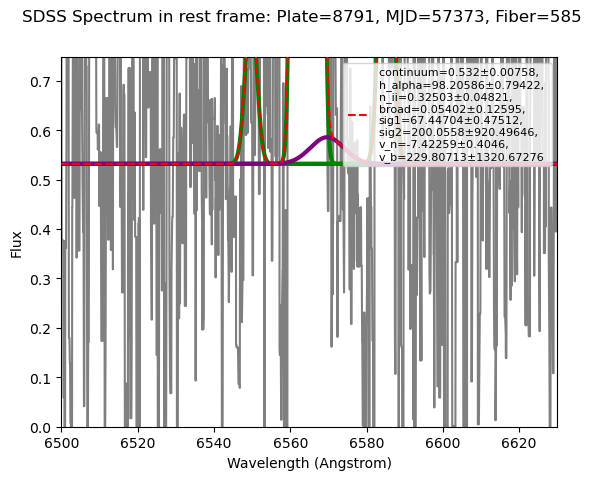

85
8856-57453-808
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   1.563   64.744    0.501    0.196   72.427  200.001   -4.253 -686.837
   0.014    1.133    0.094    0.216    0.825  248.812    1.008  257.665


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


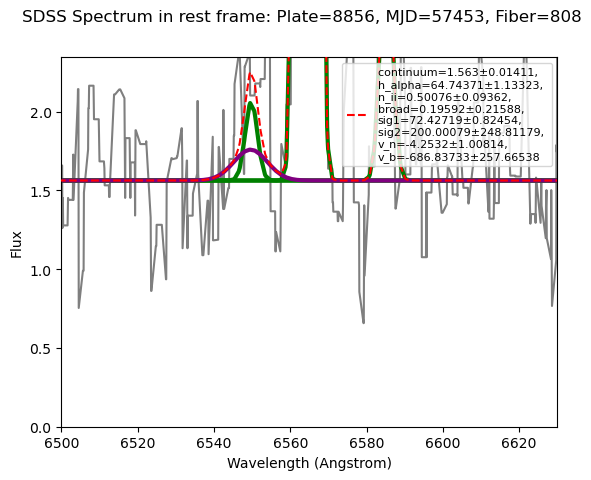

86
9142-57664-516


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.403   99.411    0.450    0.435   68.359  200.004  -14.377  139.929
   0.011    1.374    0.076    0.399    0.774  138.899    0.776  232.580


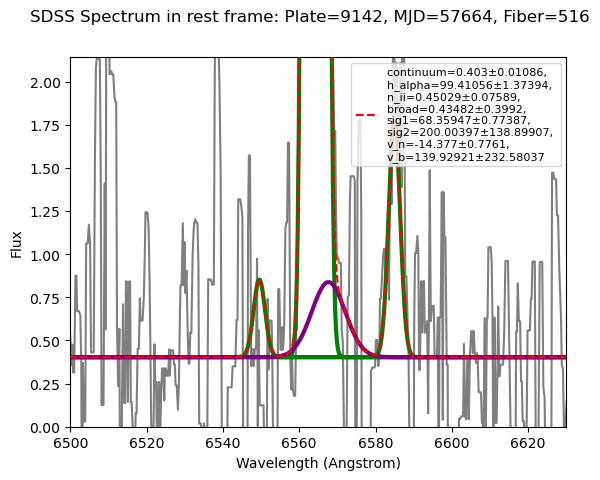

87
9146-58042-760
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.142   25.220    0.000    0.270   74.357  258.474   -2.982  817.774
   0.011    0.526    0.113    0.189    1.227  153.776    1.396  167.186


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


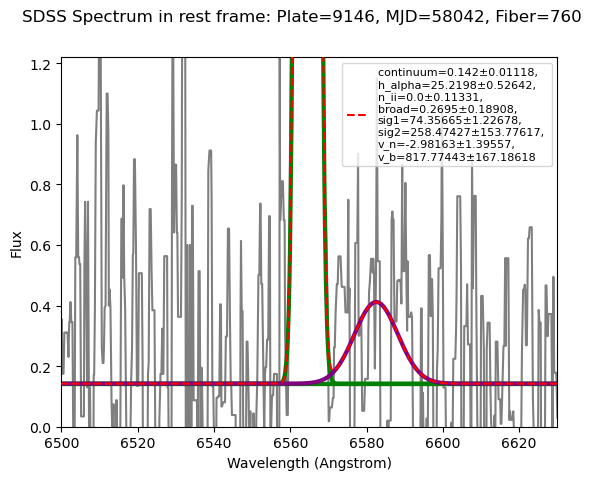

88
9175-58049-211
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.270   88.227    0.031    0.298   68.767  200.001   -2.711 -175.817
   0.010    1.186    0.052    0.250    0.695  126.677    0.716  231.350


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


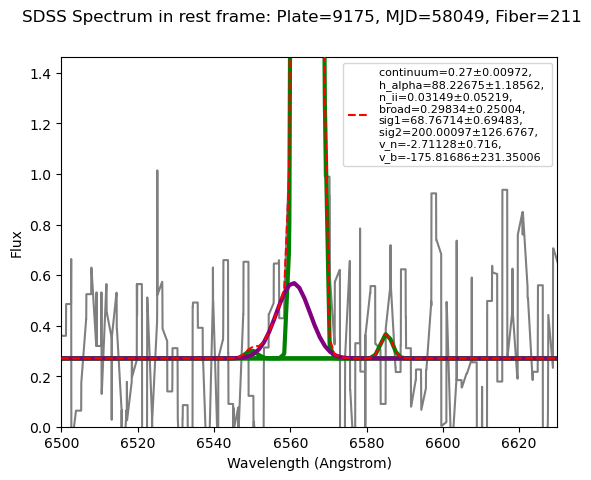

89
9550-57787-926
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.446    2.416    0.000    0.000   70.521  200.086  -16.192 1761.349
   0.012    0.312    0.091    0.136    9.894    0.000   10.012    0.000


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


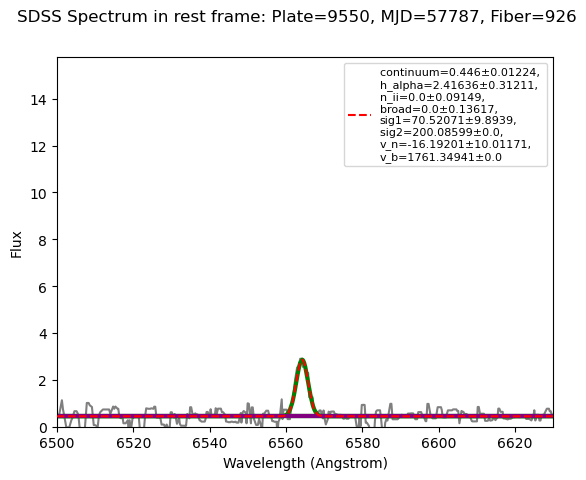

90
10252-58485-494
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.400   55.390    0.440    0.857   72.698  281.190   -7.595   31.487
   0.017    1.297    0.093    0.494    1.455  102.948    1.398   76.832


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


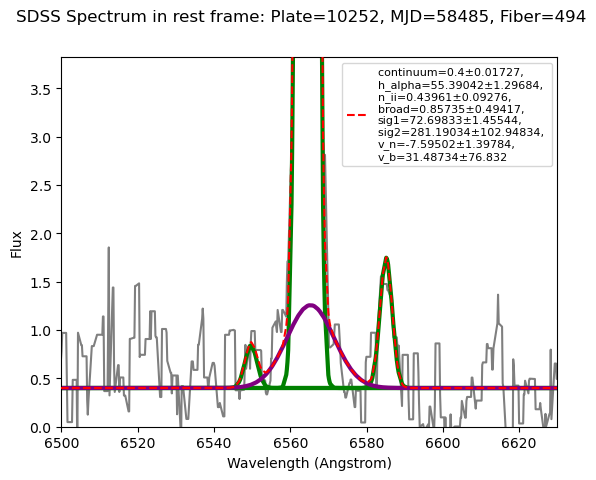

91
10261-58462-346


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.278   34.807    0.189    0.105   74.743  200.007    0.304  687.404
   0.010    0.594    0.091    0.117    0.915  347.575    1.093  381.272


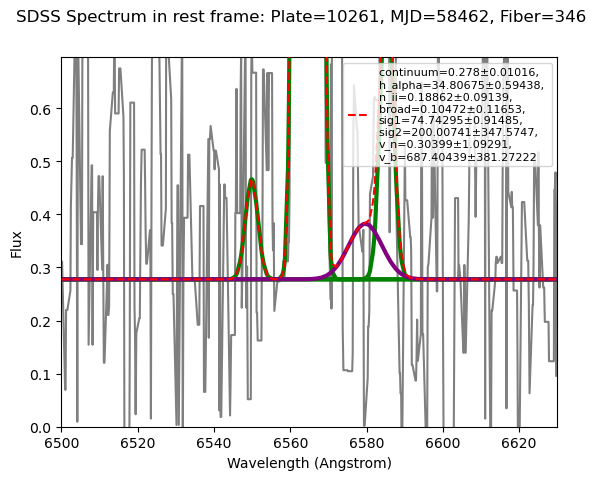

92
10664-58464-982
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   2.016  147.103    0.812    0.435   76.065  200.000   -0.557  933.206
   0.019    2.122    0.239    0.556    0.633  174.437    0.809  132.309


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


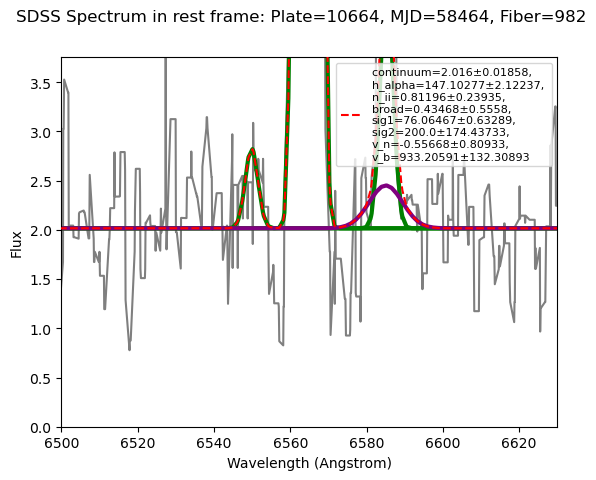

93
10741-58230-615
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.391   44.233    0.206    0.092   71.422  903.196   -6.672 -1259.166
   0.011    0.830    0.082    0.070    0.977  938.042    1.107  935.215


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


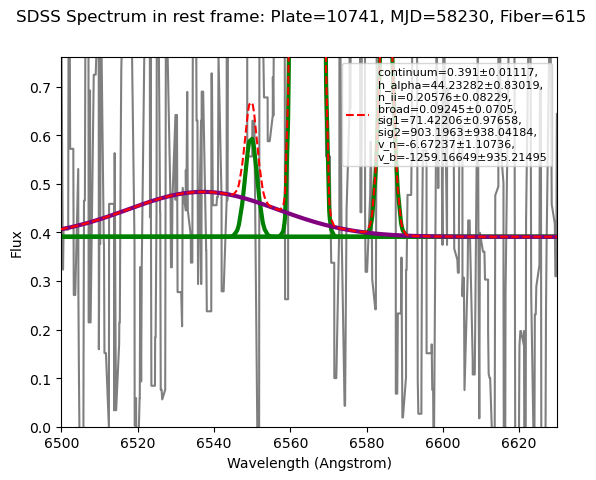

94
10745-58501-265
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.387  172.181    0.057    0.303   69.900  571.331   61.005    4.084
   0.012    2.167    0.073    0.148    0.457  253.457    0.567  199.747


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


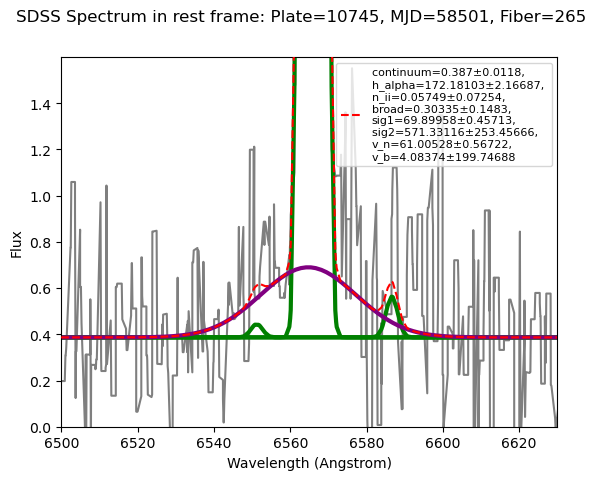

95
10745-58501-760
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.548   18.737    0.139    0.131   74.270  200.000   -9.879 1069.408
   0.020    0.859    0.196    0.430    2.931  510.032    3.341  627.961


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


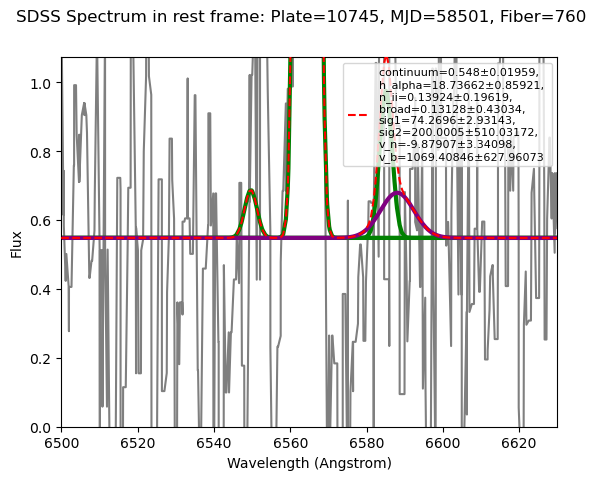

96
11051-58510-340


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.111   69.156    0.129    0.176   74.262  200.001  -14.331 1446.746
   0.011    0.885    0.060    0.138    0.606  185.448    0.749  182.811


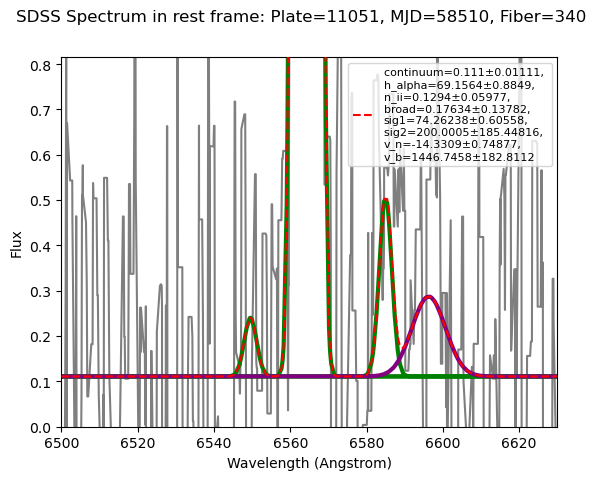

97
11075-58451-713
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.875   11.849    0.000    0.152   78.058  200.001   -8.878  632.879
   0.015    0.500    0.142    0.191    3.048  409.801    3.304  395.236


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


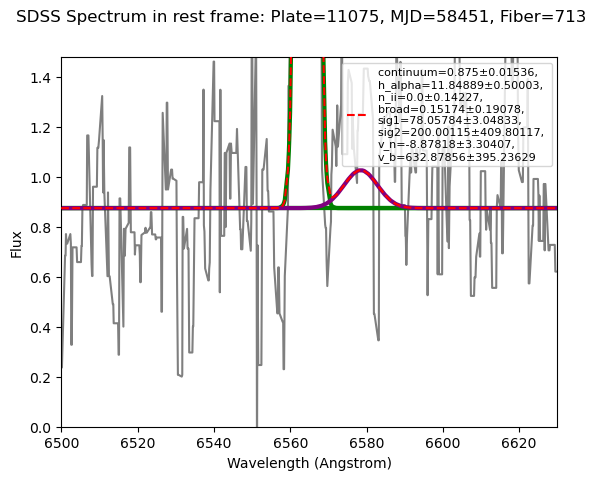

98
11294-58451-145
       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   0.271   35.597    0.096    0.143   71.815  200.000  -14.501 -131.581
   0.008    0.522    0.047    0.306    1.049  231.656    0.959  349.662


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


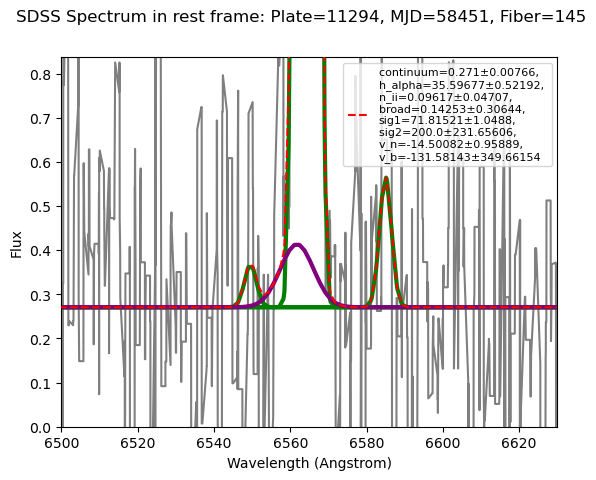

99
11678-58511-352


C:\Users\nihad\AppData\Local\Temp\ipykernel_30468\11057713.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


       B     amp1     amp2     amp3     sig1     sig2      v_n      v_b
   1.075  153.829    0.419    0.142   73.480  483.947  -13.163   66.206
   0.013    2.247    0.091    0.189    0.563  623.247    0.725  447.142


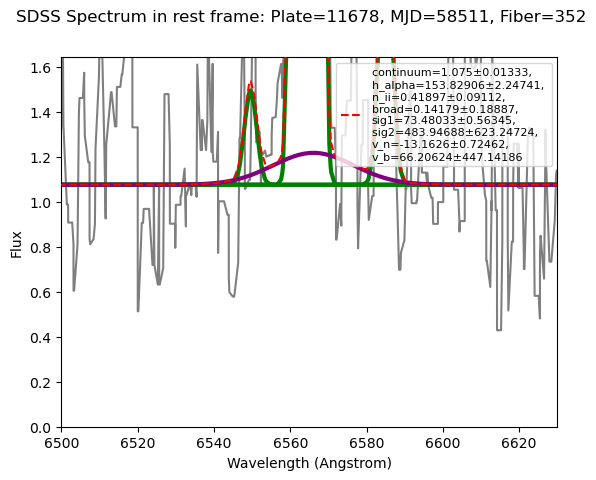

Elapsed time: 33.9913 seconds


In [35]:
# Record the start time
start_time = time.time()  # Or time.perf_counter() for higher resolution
i_list = []

for i in range(100):
    print(i)
    num = random_galaxies[i]
    gal = cut_gals[num]

    plate = gal["PLATE"]
    mjd = gal["MJD"]
    fiber = gal["FIBER"]
    print(str(gal["PLATE"]) + "-" + str(gal["MJD"])+ "-"+ str(gal["FIBER"]))
    try:
        sp = SDSS.get_spectra(plate=plate, mjd=mjd, fiberID=fiber)
    except:
        print("Shit happened, moving on")
        continue
    i_list.append(i)
    spec_hdu = sp[0]
    spec_data = spec_hdu[1].data
    
    z = spec_hdu[2].data["z"]
    
    header = spec_hdu[0].header
    
    loglam = spec_data['loglam'].copy()
    flux = spec_data['flux'].copy()
    wavelength = 10**loglam/(1+z)
    ivar = spec_data['ivar'].copy()
    uncertainty = 1/np.sqrt(ivar)

    max_y = []
    flux_sum =[]
    wave_sum = []
    ivar_sum = []
    filter = []
    nexp = header['NEXP']
    for sub_exp in range(nexp//2):
        sub_data = spec_hdu[4+nexp//2+sub_exp].data
        sub_flux = sub_data['flux']
        sub_wavelength = 10**sub_data['loglam'] / (1+z)
        sub_ivar = sub_data['ivar'] 
        flux_sum.extend(sub_flux[sub_ivar>0])
        wave_sum.extend(sub_wavelength[sub_ivar>0])
        ivar_sum.extend(sub_ivar[sub_ivar>0])
        filter.extend([sub_exp for _ in range(len(sub_flux[sub_ivar>0]))])

    combined = sorted(zip(wave_sum, flux_sum,ivar_sum,filter))
    # Unzip the sorted pairs back into separate lists
    sorted_wave, sorted_flux, sorted_ivar, sorted_filter = zip(*combined) 
        
    min = np.where(np.array(sorted_wave) > 6000)[0][0]
    max = np.where(np.array(sorted_wave) > 7000)[0][0]
        
    inf = math.inf
    ranged_wave = sorted_wave[min:max]
    ranged_flux = sorted_flux[min:max]
    
    parameters, covariance = curve_fit(Gauss_h_alpha, ranged_wave, ranged_flux,sigma = 1/np.sqrt(sorted_ivar[min:max]),  method = "trf", 
                                       p0=[2, 200, 2, 2, 50, 1000, 50, 50], bounds=([0,0,0,0,20,200,-200,-2000],[10,1000,50,50,200, 2000,200,2000]))
    B, amp1, amp2, amp3, sig1, sig2, v_n, v_b= parameters
    fit_y = Gauss_h_alpha(ranged_wave, B, amp1, amp2, amp3, sig1, sig2, v_n, v_b)
    print(" ".join(["% 8s" % s for s in " B amp1   amp2 amp3 sig1 sig2 v_n v_b".split()]))
    
    err = np.sqrt(np.diag(covariance))
    np.savetxt(sys.stdout, parameters.reshape((1,-1)), fmt="%8.3f")
    np.savetxt(sys.stdout, err.reshape((1,-1)), fmt="%8.3f")
    fig, ax = plt.subplots()
    
    plt.plot(ranged_wave, scipy.signal.medfilt(ranged_flux, kernel_size=5), '-',color = 'black',linewidth=1.5, alpha = 0.5)
    plt.plot(ranged_wave, fit_y, '--',color = 'red',linewidth=1.5, label=f"continuum={round(B,3)}±{round(err[0],5)}, \nh_alpha={round(amp1,5)}±{round(err[1],5)}, \nn_ii={round(amp2,5)}±{round(err[2],5)}, \nbroad={round(amp3,5)}±{round(err[3],5)},\nsig1={round(sig1,5)}±{round(err[4],5)},\nsig2={round(sig2,5)}±{round(err[5],5)}, \nv_n={round(v_n,5)}±{round(err[6],5)},\nv_b={round(v_b,5)}±{round(err[7],5)}", zorder=3)
    plt.plot(ranged_wave, h_alpha(ranged_wave, amp1, sig1, v_n)+B, '-',color = 'green',linewidth=3)
    plt.plot(ranged_wave, n_ii_1(ranged_wave, amp2, sig1, v_n)+B, '-',color = 'green',linewidth=3)
    plt.plot(ranged_wave, n_ii_2(ranged_wave, amp2, sig1, v_n)+B, '-',color = 'green',linewidth=3)
    plt.plot(ranged_wave, broad(ranged_wave, amp3, sig2, v_b)+B, '-',color = 'purple',linewidth=3)
    plt.legend(loc='upper right', fontsize=8)
    ylim = np.max(broad(ranged_wave, amp3, sig2, v_b))
    
    if round(ylim,5) == 0:
        ylim = np.max(ranged_flux)/100

    plt.xlabel("Wavelength (Angstrom)")
    plt.ylabel("Flux")
    plt.suptitle(f"SDSS Spectrum in rest frame: Plate={plate}, MJD={mjd}, Fiber={fiber}")
    plt.xlim(6500, 6630)
    plt.ylim(0, B + 4*ylim)
    plt.savefig(str(plate) + "-" + str(mjd)+ "-"+ str(fiber)+"gaussian_h_alpha.jpeg")
    plt.show()


# Record the end time
end_time = time.time()  # Or time.perf_counter()

# Calculate and print the elapsed time
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time:.4f} seconds")

In [50]:
print(len(i_list))

100


In [13]:
c = 3*10**5 #km/s
inf = math.inf

def h_alpha(x, amp, sig, v):
    x_0 = 6564.61 * (1+(v/c))
    wid= sig*x_0/c
    return (amp * np.exp(-(x- x_0)**2 / (2 * wid**2)))

def n_ii_1(x, amp, sig, v):
    x_0 = 6549.86 * (1+(v/c))
    wid= sig*x_0/c
    return (amp * np.exp(-(x- x_0)**2 / (2 * wid**2)))

def n_ii_2(x, amp, sig, v):
    x_0 = 6585.27 * (1+(v/c))
    wid= sig*x_0/c
    return (amp * np.exp(-(x- x_0)**2 / (2 * wid**2))/0.326)

def Gauss_h_alpha_no_broad(x, b,amp1, amp2, sig, v_n):
    return  b + h_alpha(x, amp1, sig, v_n) + n_ii_1(x, amp2, sig, v_n) + n_ii_2(x, amp2, sig, v_n)

0
3590-55201-626
16


C:\Users\nihad\AppData\Local\Temp\ipykernel_42736\3812962255.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


       B     amp1     amp2      sig      v_n
   0.400   15.508    0.000   74.778   -7.526
   0.010    0.364    0.086    1.578    1.745


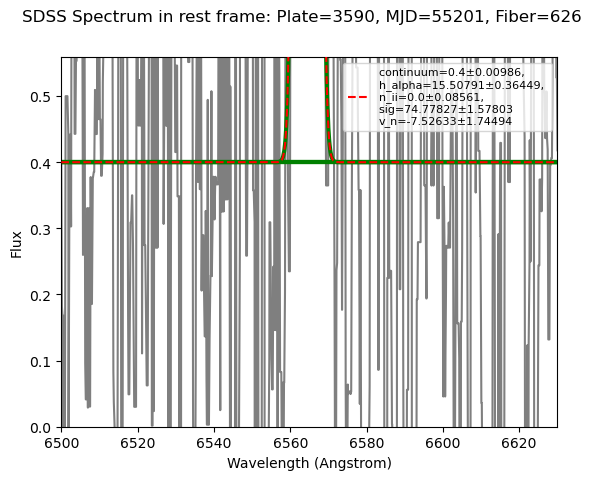

1
3658-55205-474
14
       B     amp1     amp2      sig      v_n
   0.360   13.355    0.078   68.214  -13.064
   0.009    0.356    0.054    1.522    1.683


C:\Users\nihad\AppData\Local\Temp\ipykernel_42736\3812962255.py:31: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


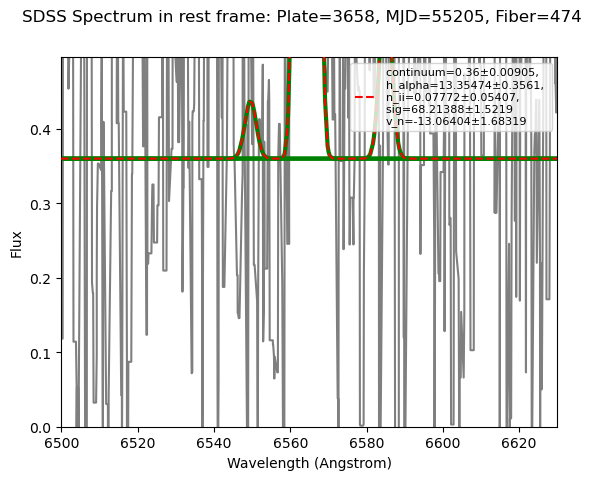

2
3670-55480-196
Shit happened, moving on
3
3736-55214-352


In [ ]:
# Record the start time
start_time = time.time()  # Or time.perf_counter() for higher resolution
i_list = []

for i in range(100):
    print(i)
    num = random_galaxies[i]
    gal = cut_gals[num]

    plate = gal["PLATE"]
    mjd = gal["MJD"]
    fiber = gal["FIBER"]
    print(str(gal["PLATE"]) + "-" + str(gal["MJD"])+ "-"+ str(gal["FIBER"]))
    try:
        sp = SDSS.get_spectra(plate=plate, mjd=mjd, fiberID=fiber, data_release=17)
    except:
        print("Shit happened, moving on")
        continue
    i_list.append(i)
    spec_hdu = sp[0]
    spec_data = spec_hdu[1].data
    
    z = spec_hdu[2].data["z"]
    
    header = spec_hdu[0].header
    
    loglam = spec_data['loglam'].copy()
    flux = spec_data['flux'].copy()
    wavelength = 10**loglam/(1+z)
    ivar = spec_data['ivar'].copy()
    uncertainty = 1/np.sqrt(ivar)

    max_y = []
    flux_sum =[]
    wave_sum = []
    ivar_sum = []
    filter = []
    nexp = header['NEXP']
    print(nexp)
    for sub_exp in range(nexp//2):
        sub_data = spec_hdu[4+nexp//2+sub_exp].data
        sub_flux = sub_data['flux']
        sub_wavelength = 10**sub_data['loglam'] / (1+z)
        sub_ivar = sub_data['ivar'] 
        flux_sum.extend(sub_flux[sub_ivar>0])
        wave_sum.extend(sub_wavelength[sub_ivar>0])
        ivar_sum.extend(sub_ivar[sub_ivar>0])
        filter.extend([sub_exp for _ in range(len(sub_flux[sub_ivar>0]))])

    combined = sorted(zip(wave_sum, flux_sum,ivar_sum,filter))
    # Unzip the sorted pairs back into separate lists
    sorted_wave, sorted_flux, sorted_ivar, sorted_filter = zip(*combined) 
        
    min = np.where(np.array(sorted_wave) > 6000)[0][0]
    max = np.where(np.array(sorted_wave) > 7000)[0][0]
        
    inf = math.inf
    ranged_wave = sorted_wave[min:max]
    ranged_flux = sorted_flux[min:max]
    
    parameters, covariance = curve_fit(Gauss_h_alpha_no_broad, ranged_wave, ranged_flux,sigma = 1/np.sqrt(sorted_ivar[min:max]),  method = "trf", 
                                       p0=[2, 200, 2, 50, 50], bounds=([0,0,0,20,-200],[10,1000,20,200, 200]))
    B, amp1, amp2, sig, v_n= parameters
    fit_y = Gauss_h_alpha_no_broad(ranged_wave, B, amp1, amp2, sig, v_n)
    print(" ".join(["% 8s" % s for s in " B amp1 amp2 sig v_n".split()]))
    
    err = np.sqrt(np.diag(covariance))
    np.savetxt(sys.stdout, parameters.reshape((1,-1)), fmt="%8.3f")
    np.savetxt(sys.stdout, err.reshape((1,-1)), fmt="%8.3f")
    fig, ax = plt.subplots()
    
    plt.plot(ranged_wave, scipy.signal.medfilt(ranged_flux, kernel_size=5), '-',color = 'black',linewidth=1.5, alpha = 0.5)
    plt.plot(ranged_wave, fit_y, '--',color = 'red',linewidth=1.5, label=f"continuum={round(B,3)}±{round(err[0],5)}, \nh_alpha={round(amp1,5)}±{round(err[1],5)}, \nn_ii={round(amp2,5)}±{round(err[2],5)},\nsig={round(sig,5)}±{round(err[3],5)} \nv_n={round(v_n,5)}±{round(err[4],5)}", zorder=3)
    plt.plot(ranged_wave, h_alpha(ranged_wave, amp1, sig, v_n)+B, '-',color = 'green',linewidth=3)
    plt.plot(ranged_wave, n_ii_1(ranged_wave, amp2, sig, v_n)+B, '-',color = 'green',linewidth=3)
    plt.plot(ranged_wave, n_ii_2(ranged_wave, amp2, sig, v_n)+B, '-',color = 'green',linewidth=3)
    plt.legend(loc='upper right', fontsize=8)
    ylim = np.max(fit_y)
    
    if round(ylim,5) == 0:
        ylim = np.max(ranged_flux)/100

    plt.xlabel("Wavelength (Angstrom)")
    plt.ylabel("Flux")
    plt.suptitle(f"SDSS Spectrum in rest frame: Plate={plate}, MJD={mjd}, Fiber={fiber}")
    plt.xlim(6500, 6630)
    plt.ylim(0, B + ylim/100)
    plt.savefig(str(plate) + "-" + str(mjd)+ "-"+ str(fiber)+"gaussian_h_alpha_no_broad.jpeg")
    plt.show()


# Record the end time
end_time = time.time()  # Or time.perf_counter()

# Calculate and print the elapsed time
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time:.4f} seconds")

In [51]:
def merge_images(file1, file2):
    """Merge two images into one, displayed side by side
    :param file1: path to first image file
    :param file2: path to second image file
    :return: the merged Image object
    """
    image1 = Image.open(file1)
    image2 = Image.open(file2)
    (width1, height1) = image1.size
    (width2, height2) = image2.size

    result_height = height1 + height2
    result_width = width1

    result = Image.new('RGB', (result_width, result_height))
    result.paste(im=image1, box=(0, 0))
    result.paste(im=image2, box=(0, height1))
    return result

for i in range(100):
    num = random_galaxies[i]
    gal = cut_gals[num]
    plate = gal["PLATE"]
    mjd = gal["MJD"]
    fiber = gal["FIBER"]
    im1 = str(plate) + "-" + str(mjd)+ "-"+ str(fiber)+"gaussian_h_alpha.jpeg"
    im2 = str(plate) + "-" + str(mjd)+ "-"+ str(fiber)+"gaussian_h_alpha_no_broad.jpeg"
    merge = merge_images(im1, im2)
    merge.save(str(i)+".jpeg")

pdf = FPDF()
# imagelist is the list with all image filenames
for i in range(100):
    pdf.add_page()
    pdf.image(str(i)+".jpeg",w=pdf.epw,h=pdf.eph)
pdf.output("h_alpha_analysis_w_gaussian.pdf")